In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


# Web Scraping Thumbnail

## Detik.com

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkDetik(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  img = soup.find('meta', {'name':'thumbnailUrl'})['content']
  # print(img)

  response = requests.get(img)
  im = Image.open(BytesIO(response.content))
  return im

In [ ]:
dfDetik = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/detikNews.csv')
print(len(dfDetik))
dfDetik.drop_duplicates(inplace=True)
print(len(dfDetik))

5852
5469


In [ ]:
dfAnnoDetik = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_detikNews.csv')
print(len(dfAnnoDetik))
dfAnnoDetik.drop_duplicates(inplace=True)
print(len(dfAnnoDetik))

1000
1000


In [ ]:
dfDetik.iloc[424]['title'] = dfAnnoDetik.iloc[423]['title']
# trailing space di dfDetik

<ipython-input-6-f9fe9438bee5>:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  dfDetik.iloc[424]['title'] = dfAnnoDetik.iloc[423]['title']


In [ ]:
dfRealDetik = pd.merge(dfAnnoDetik, dfDetik, on='title')
len(dfRealDetik)

1000

In [ ]:
dfRealDetik[['title','label','label_score']].compare(dfAnnoDetik)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealDetik.to_csv('/content/drive/MyDrive/click-id/dataset/detik.csv')

In [ ]:
filenum = 0
banned = [327,461,262,159,110,108]
for url in dfRealDetik.loc[:,'url']:
  if not os.path.isfile('/content/drive/MyDrive/click-id/images/detik/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealDetik.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkDetik(url)
    print(thumbnail)
    im2arr = np.array(thumbnail)
    cv2.imwrite('/content/drive/MyDrive/click-id/images/detik/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  filenum = filenum+1

## Fimela

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkFimela(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'itemprop':'image'}) == None):
    return 1
  img = soup.find('meta', {'itemprop':'image'})['content']
  # print(img)

  response = requests.get(img)
  im = Image.open(BytesIO(response.content))
  return im

In [ ]:
dfFimela = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/fimela.csv')
print(len(dfFimela))
dfFimela.drop_duplicates(inplace=True)
print(len(dfFimela))

788
788


In [ ]:
dfAnnoFimela = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_fimela.csv')
print(len(dfAnnoFimela))
dfAnnoFimela.drop_duplicates(inplace=True)
print(len(dfAnnoFimela))

700
700


In [ ]:
dfRealFimela = pd.merge(dfAnnoFimela, dfFimela, on='title')
len(dfRealFimela)

700

In [ ]:
dfRealFimela[['title','label','label_score']].compare(dfAnnoFimela)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealFimela.to_csv('/content/drive/MyDrive/click-id/dataset/fimela.csv')

In [ ]:
filenum = 0
banned = [34, 69, 72, 155, 157, 233, 237, 319, 322, 377, 388, 390, 459, 464, 472, 475, 535, 539, 581, 611, 616, 699]
for url in dfRealFimela.loc[:,'url']:
  if not os.path.isfile('/content/drive/MyDrive/click-id/images/fimela/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealFimela.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkFimela(url)
    if (thumbnail == 1):
      banned.append(filenum)
    else:

      print(thumbnail)
      im2arr = np.array(thumbnail)
      cv2.imwrite('/content/drive/MyDrive/click-id/images/fimela/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  filenum = filenum+1
  print(banned)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
34
Dalam Sehari, Maksimalnya Berapa Kali Suami Istri Bisa Berhubungan Intim?
https://www.fimela.com/lifestyle-relationship/read/4059116/dalam-sehari-maksimalnya-berapa-kali-suami-istri-bisa-berhubungan-intim
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
[34]
69
5 Rahasia Kecantikan Tradisional para Perempuan Tiongkok
https://www.fimela.com/beauty-health/read/4058875/5-rahasia-kecantikan-tradisional-para-perempuan-tiongkok
[34, 69]
[34, 69]
[34, 69]
72
Rekomendasi Essential Oil dengan Kandungan Tea Tree yang Kulit Berjerawat
https://www.fimela.com/beauty-health/read/4059101/rekomendasi-essential-oil-dengan-kandungan-tea-tree-yang-kulit-berjerawat
[34, 69, 72]
[34, 69, 72]
[34, 69, 72]
[34, 69, 72]
[34, 69, 72]
[34, 69, 72]
[34, 69, 72]
[34, 69, 72]
[34, 69, 72]
[34

## Kapanlagi

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkKapanlagi(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'property':'og:image'}) == None):
    return 1
  img = soup.find('meta', {'property':'og:image'})['content']
  # print(img)

  response = requests.get(img)
  try: # checking broken link
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfKapanlagi = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/kapanlagi.csv')
print(len(dfKapanlagi))
dfKapanlagi.drop_duplicates(inplace=True)
print(len(dfKapanlagi))

1006
1006


In [ ]:
dfAnnoKapanlagi = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_kapanlagi.csv')
print(len(dfAnnoKapanlagi))
dfAnnoKapanlagi.drop_duplicates(inplace=True)
dfAnnoKapanlagi.reset_index(drop=True, inplace=True)
print(len(dfAnnoKapanlagi))

1000
998


In [ ]:
dfRealKapanlagi = pd.merge(dfAnnoKapanlagi, dfKapanlagi, on='title')
print(len(dfRealKapanlagi))
dfRealKapanlagi.drop_duplicates(inplace=True)
print(len(dfRealKapanlagi))
# duplicate manually found
dfRealKapanlagi.drop(148, inplace=True)
dfRealKapanlagi.drop(275, inplace=True)
dfRealKapanlagi.reset_index(drop=True, inplace=True)
print(len(dfRealKapanlagi))

1000
1000
998


In [ ]:
dfRealKapanlagi[['title','label','label_score']].compare(dfAnnoKapanlagi)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealKapanlagi.to_csv('/content/drive/MyDrive/click-id/dataset/kapanlagi.csv')

In [ ]:
filenum = 0
banned = [16, 303, 310, 311, 312, 318, 319, 322, 326, 328, 329, 330, 331, 334, 383, 442, 443, 445, 453, 457, 459, 461, 462, 470, 473, 482, 484, 495, 508, 510, 518, 630, 631, 661, 692, 706]
for url in dfRealKapanlagi.loc[:,'url']:
  if not os.path.isfile('/content/drive/MyDrive/click-id/images/kapanlagi/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealKapanlagi.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkKapanlagi(url)
    if (thumbnail == 1):
      banned.append(filenum)
    else:
      print(thumbnail)
      im2arr = np.array(thumbnail)
      cv2.imwrite('/content/drive/MyDrive/click-id/images/kapanlagi/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  filenum = filenum+1
  print(banned)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
16
Sinopsis Sinetron 'ORANG KETIGA' Episode 631 Tayang Rabu, 10 April 2019
https://www.kapanlagi.com/showbiz/sinetron/sinopsis-sinetron-orang-ketiga-episode-631-tayang-rabu-10-april-2019-07833e.html
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16]
[16

## Kompas

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkKompas(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('div', {'class':'photo__wrap'}) == None):
    return 1
  photo_wrapper = soup.find('div', {'class':'photo__wrap'})
  img = photo_wrapper.find('img')['src']
  print(img)

  response = requests.get(img)
  try: # checking broken link
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfKompas = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/kompas.csv')
print(len(dfKompas))
dfKompas.drop_duplicates(inplace=True)
print(len(dfKompas))

3253
3253


In [ ]:
dfAnnoKompas = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_kompas.csv')
print(len(dfAnnoKompas))
dfAnnoKompas.drop_duplicates(inplace=True)
dfAnnoKompas.drop(348, inplace=True)
dfAnnoKompas.drop(504, inplace=True)
dfAnnoKompas.drop(602, inplace=True)
dfAnnoKompas.drop(618, inplace=True)
dfAnnoKompas.drop(849, inplace=True)
dfAnnoKompas.reset_index(drop=True, inplace=True)
print(len(dfAnnoKompas))

1500
1495


In [ ]:
dfRealKompas = pd.merge(dfAnnoKompas, dfKompas, on='title')
print(len(dfRealKompas))
dfRealKompas.drop_duplicates(inplace=True)
print(len(dfRealKompas))
dfRealKompas.reset_index(drop=True, inplace=True)
print(len(dfRealKompas))

1495
1495
1495


In [ ]:
dfRealKompas[['title','label','label_score']].compare(dfAnnoKompas)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealKompas.to_csv('/content/drive/MyDrive/click-id/dataset/kompas.csv')

In [ ]:
filenum = 0
banned = [787]
for url in dfRealKompas.loc[:,'url']:
  if not os.path.isfile('/content/drive/MyDrive/click-id/images/kompas/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealKompas.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkKompas(url)
    if (thumbnail == 1):
      banned.append(filenum)
    else:
      print(thumbnail)
      im2arr = np.array(thumbnail)
      cv2.imwrite('/content/drive/MyDrive/click-id/images/kompas/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  filenum = filenum+1
  print(banned)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

## Liputan6

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkLiputan6(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'property':'og:image'}) == None):
    return 1
  img = soup.find('meta', {'property':'og:image'})['content']

  response = requests.get(img)
  try: # checking broken link
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfLiputan6 = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/liputan6.csv')
print(len(dfLiputan6))
dfLiputan6.drop_duplicates(inplace=True)
print(len(dfLiputan6))

4581
4581


In [ ]:
dfAnnoLiputan6 = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_liputan6.csv')
print(len(dfAnnoLiputan6))
dfAnnoLiputan6.drop_duplicates(inplace=True)
manualDrop = [111, 158, 315, 496, 498, 544, 585, 593, 842, 926, 952, 969, 1046, 1123]
temp = 0
for dropThis in manualDrop:
  dfAnnoLiputan6.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoLiputan6.reset_index(drop=True, inplace=True)
print(len(dfAnnoLiputan6))

1500
1485


In [ ]:
dfRealLiputan6 = pd.merge(dfAnnoLiputan6, dfLiputan6, on='title')
print(len(dfRealLiputan6))
dfRealLiputan6.drop_duplicates(inplace=True)
print(len(dfRealLiputan6))
manualDrop = [722]
temp = 0
for dropThis in manualDrop:
  dfRealLiputan6.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealLiputan6.reset_index(drop=True, inplace=True)
print(len(dfRealLiputan6))

1486
1486
1485


In [ ]:
dfRealLiputan6[['title','label','label_score']].compare(dfAnnoLiputan6)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealLiputan6.to_csv('/content/drive/MyDrive/click-id/dataset/liputan6.csv')

In [ ]:
filenum = 0
banned = [1399, 1390, 1386, 906, 905, 432]
for url in dfRealLiputan6.loc[:,'url']:
  if not os.path.isfile('/content/drive/MyDrive/click-id/images/liputan6/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealLiputan6.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkLiputan6(url)
    if (thumbnail == 1):
      banned.append(filenum)
    else:
      print(thumbnail)
      im2arr = np.array(thumbnail)
      cv2.imwrite('/content/drive/MyDrive/click-id/images/liputan6/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  filenum = filenum+1
  print(banned)

[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1386, 906, 905, 432]
[1399, 1390, 1

## Okezone

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkOkezone(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'property':'og:image'}) == None):
    return 1
  img = soup.find('meta', {'property':'og:image'})['content']

  response = requests.get(img)
  try: # checking broken link
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfOkezone = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/okezone.csv')
print(len(dfOkezone))
dfOkezone.drop_duplicates(inplace=True)
print(len(dfOkezone))

4664
4664


In [ ]:
dfAnnoOkezone = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_okezone.csv')
print(len(dfAnnoOkezone))
dfAnnoOkezone.drop_duplicates(inplace=True)
manualDrop = []
temp = 0
for dropThis in manualDrop:
  dfAnnoOkezone.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoOkezone.reset_index(drop=True, inplace=True)
print(len(dfAnnoOkezone))

1500
1500


In [ ]:
dfRealOkezone = pd.merge(dfAnnoOkezone, dfOkezone, on='title')
print(len(dfRealOkezone))
dfRealOkezone.drop_duplicates(inplace=True)
print(len(dfRealOkezone))
manualDrop = [1076]
temp = 0
for dropThis in manualDrop:
  dfRealOkezone.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealOkezone.reset_index(drop=True, inplace=True)
print(len(dfRealOkezone))

1501
1501
1500


In [ ]:
dfRealOkezone[['title','label','label_score']].compare(dfAnnoOkezone)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealOkezone.to_csv('/content/drive/MyDrive/click-id/dataset/okezone.csv')

In [ ]:
filenum = 0
banned = [69, 195, 336, 349, 352, 426, 589, 695, 875, 1037, 1091, 1184, 1280, 1334, 1346, 1355, 1320, 1282, 1237, 1151, 1002, 914, 902, 768, 747, 731, 700, 616, 520, 432, 275, 156, 16]
for url in dfRealOkezone.loc[:,'url']:
  try:
    if not os.path.isfile('/content/drive/MyDrive/click-id/images/okezone/'+str(filenum)+'.jpg') and filenum not in banned:
      print(filenum)
      print(dfRealOkezone.loc[filenum,'title'])
      print(url)
      thumbnail = searchLinkOkezone(url)
      if (thumbnail == 1):
        banned.append(filenum)
      else:
        print(thumbnail)
        im2arr = np.array(thumbnail)
        cv2.imwrite('/content/drive/MyDrive/click-id/images/okezone/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  except:
    banned.append(filenum)
  filenum = filenum+1
  print(banned)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
69
Fitur WhatsApp Verifikasi Dua Langkah Perkuat Keamanan Informasi
https://techno.okezone.com/read/2019/09/14/207/2104834/fitur-whatsapp-verifikasi-dua-langkah-perkuat-keamanan-informasi
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]
[69]


## Pos Metro

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkPosMetro(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'property':'og:image'}) == None):
    return 1
  img = soup.find('meta', {'property':'og:image'})['content']

  response = requests.get(img)
  try: # checking broken link
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfPosMetro = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/pos_metro.csv')
print(len(dfPosMetro))
dfPosMetro.drop_duplicates(inplace=True)
print(len(dfPosMetro))

307
307


In [ ]:
dfAnnoPosMetro = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_pos_metro.csv')
print(len(dfAnnoPosMetro))
dfAnnoPosMetro.drop_duplicates(inplace=True)
manualDrop = []
temp = 0
for dropThis in manualDrop:
  dfAnnoPosMetro.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoPosMetro.reset_index(drop=True, inplace=True)
print(len(dfAnnoPosMetro))

300
300


In [ ]:
dfRealPosMetro = pd.merge(dfAnnoPosMetro, dfPosMetro, on='title')
print(len(dfRealPosMetro))
dfRealPosMetro.drop_duplicates(inplace=True)
print(len(dfRealPosMetro))
manualDrop = []
temp = 0
for dropThis in manualDrop:
  dfRealPosMetro.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealPosMetro.reset_index(drop=True, inplace=True)
print(len(dfRealPosMetro))

300
300
300


In [ ]:
dfRealPosMetro[['title','label','label_score']].compare(dfAnnoPosMetro)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealPosMetro.to_csv('/content/drive/MyDrive/click-id/dataset/pos_metro.csv')

In [ ]:
filenum = 0
banned = [30, 35, 39]
for url in dfRealPosMetro.loc[:,'url']:
  try:
    if not os.path.isfile('/content/drive/MyDrive/click-id/images/pos_metro/'+str(filenum)+'.jpg') and filenum not in banned:
      print(filenum)
      print(dfRealPosMetro.loc[filenum,'title'])
      print(url)
      thumbnail = searchLinkPosMetro(url)
      if (thumbnail == 1):
        banned.append(filenum)
      else:
        print(thumbnail)
        im2arr = np.array(thumbnail)
        cv2.imwrite('/content/drive/MyDrive/click-id/images/pos_metro/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  except:
    banned.append(filenum)
  filenum = filenum+1
  print(banned)

[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]
[30, 35, 39]

## Republika

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkRepublika(link):
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'property':'og:image'}) == None):
    return 1
  img = soup.find('meta', {'property':'og:image'})['content']

  response = requests.get(img)
  try: # checking broken link
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfRepublika = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/republika.csv')
print(len(dfRepublika))
dfRepublika.drop_duplicates(inplace=True)
print(len(dfRepublika))

6086
6086


In [ ]:
dfAnnoRepublika = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_republika.csv')
print(len(dfAnnoRepublika))
dfAnnoRepublika.drop_duplicates(inplace=True)
manualDrop = [94, 316, 355, 594, 740]
temp = 0
for dropThis in manualDrop:
  dfAnnoRepublika.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoRepublika.reset_index(drop=True, inplace=True)
print(len(dfAnnoRepublika))

1500
1493


In [ ]:
dfRealRepublika = pd.merge(dfAnnoRepublika, dfRepublika, on='title')
print(len(dfRealRepublika))
dfRealRepublika.drop_duplicates(inplace=True)
print(len(dfRealRepublika))
manualDrop = [965, 1170]
temp = 0
for dropThis in manualDrop:
  dfRealRepublika.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealRepublika.reset_index(drop=True, inplace=True)
print(len(dfRealRepublika))

1493
1493
1491


In [ ]:
manualDrop = [1286, 1363]
temp = 0
for dropThis in manualDrop:
  dfAnnoRepublika.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoRepublika.reset_index(drop=True, inplace=True)
print(len(dfAnnoRepublika))

1491


In [ ]:
dfRealRepublika[['title','label','label_score']].compare(dfAnnoRepublika)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealRepublika.to_csv('/content/drive/MyDrive/click-id/dataset/republika.csv')

In [ ]:
filenum = 0
banned = [33, 69, 115, 151, 178, 280, 329, 716, 756, 764, 783, 819, 832, 879, 881, 946, 978, 1236, 1487]
for url in dfRealRepublika.loc[:,'url']:
  try:
    if not os.path.isfile('/content/drive/MyDrive/click-id/images/republika/'+str(filenum)+'.jpg') and filenum not in banned:
      print(filenum)
      print(dfRealRepublika.loc[filenum,'title'])
      print(url)
      thumbnail = searchLinkRepublika(url)
      if (thumbnail == 1):
        banned.append(filenum)
      else:
        print(thumbnail)
        im2arr = np.array(thumbnail)
        cv2.imwrite('/content/drive/MyDrive/click-id/images/republika/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  except:
    banned.append(filenum)
  filenum = filenum+1
  print(banned)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
33
Jumlah Subscriber Youtube Blackpink Salip One Direction
https://trendtek.republika.co.id/berita/pxm48w414/jumlah-emsubscriber-emyoutube-blackpink-salip-one-direction
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
[33]
69
Investasi Timur Tengah Rendah, BKPM Bentuk Komisi Khusus
https://republika.co.id/berita/pxm0oh383/investasi-timur-tengah-rendah-bkpm-bentuk-komisi-khusus
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]
[33, 69]

## Sindonews

Website protected so requests can't access, gotta use selenium

In [ ]:
%pip install -q google-colab-selenium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.9/492.9 kB 10.0 MB/s eta 0:00:00


In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os
import google_colab_selenium as gs
import urllib.request

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkSindonews(link):
  try:
    driver = gs.Chrome()
    driver.set_page_load_timeout(20)
    driver.get(link)
    # print(driver.current_url, link)
    # print(driver.current_url == link)
    driver.implicitly_wait(1)

    # website = requests.get(link)
    # html = website.text
    soup = BeautifulSoup(driver.page_source,'lxml')
    if (soup.find('meta', {'property':'og:image'}) == None):
      driver.quit()
      return 1
    img = soup.find('meta', {'property':'og:image'})['content']

    print(img)
    driver.quit()
    return img
  except:
    return 1

In [ ]:
dfSindonews = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/sindonews.csv')
print(len(dfSindonews))
dfSindonews.drop_duplicates(inplace=True)
print(len(dfSindonews))

3572
3572


In [ ]:
dfAnnoSindonews = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_sindonews.csv')
print(len(dfAnnoSindonews))
dfAnnoSindonews.drop_duplicates(inplace=True)
manualDrop = [416, 456]
temp = 0
for dropThis in manualDrop:
  dfAnnoSindonews.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoSindonews.reset_index(drop=True, inplace=True)
print(len(dfAnnoSindonews))

1500
1496


In [ ]:
dfRealSindonews = pd.merge(dfAnnoSindonews, dfSindonews, on='title')
print(len(dfRealSindonews))
dfRealSindonews.drop_duplicates(inplace=True)
print(len(dfRealSindonews))
manualDrop = [374, 714]
temp = 0
for dropThis in manualDrop:
  dfRealSindonews.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealSindonews.reset_index(drop=True, inplace=True)
print(len(dfRealSindonews))

1493
1493
1491


In [ ]:
manualDrop = [745, 813, 1028, 1354, 1433]
temp = 0
for dropThis in manualDrop:
  dfAnnoSindonews.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoSindonews.reset_index(drop=True, inplace=True)
print(len(dfAnnoSindonews))

1491


In [ ]:
dfRealSindonews[['title','label','label_score']].compare(dfAnnoSindonews)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealSindonews.to_csv('/content/drive/MyDrive/click-id/dataset/sindonews.csv')

In [ ]:
filenum = 0
banned = [3, 4, 10, 11, 12, 14, 16, 17, 18, 21, 22, 23, 24, 29, 35, 36, 38, 40, 41, 43, 44, 45, 46, 47, 48, 49, 52, 53, 55, 56, 57, 60, 62, 65, 67, 69, 70, 71, 72, 75, 80, 82, 83, 84, 85, 86, 87, 89, 90, 94, 96, 98, 99, 100, 101, 102, 103, 105, 108, 109, 110, 114, 116, 117, 118, 119, 120, 121, 122, 123, 124, 129, 133, 137, 138, 141, 142, 144, 147, 148, 152, 153, 154, 156, 159, 161, 162, 165, 166, 168, 170, 171, 173, 174, 175, 179, 180, 183, 186, 187, 194, 196, 201, 203, 204, 205, 206, 208, 209, 210, 211, 212, 213, 214, 215, 218, 219, 220, 221, 224, 227, 228, 229, 233, 234, 238, 241, 242, 246, 247, 250, 254, 255, 256, 258, 259, 263, 264, 271, 274, 276, 277, 278, 280, 281, 282, 284, 286, 289, 290, 292, 295, 296, 298, 300, 301, 303, 304, 306, 308, 310, 312, 314, 315, 317, 320, 322, 324, 326, 327, 330, 333, 334, 335, 336, 337, 340, 342, 344, 347, 348, 351, 355, 358, 359, 361, 365, 368, 370, 371, 372, 373, 374, 378, 379, 380, 383, 386, 388, 390, 394, 395, 396, 397, 398, 402, 403, 404, 405, 406, 408, 411, 415, 416, 418, 419, 420, 421, 422, 425, 426, 427, 433, 436, 437, 438, 439, 442, 444, 445, 446, 449, 451, 452, 453, 454, 455, 456, 458, 459, 460, 466, 467, 468, 469, 471, 473, 476, 479, 480, 482, 483, 489, 494, 498, 499, 500, 501, 502, 503, 504, 505, 507, 508, 509, 512, 514, 516, 518, 519, 520, 523, 524, 525, 526, 532, 533, 534, 536, 538, 539, 540, 542, 543, 546, 548, 550, 551, 553, 559, 560, 561, 562, 564, 565, 567, 571, 572, 573, 574, 576, 579, 580, 583, 584, 588, 589, 595, 596, 597, 598, 599, 602, 606, 607, 609, 610, 612, 613, 614, 615, 617, 623, 624, 628, 629, 630, 632, 634, 635, 636, 638, 639, 644, 645, 646, 647, 649, 650, 655, 656, 657, 659, 660, 661, 662, 666, 667, 671, 672, 675, 676, 678, 679, 681, 683, 685, 688, 689, 690, 691, 696, 701, 702, 704, 706, 710, 711, 712, 713, 717, 718, 720, 724, 725, 726, 727, 728, 730, 732, 734, 735, 738, 740, 742, 743, 744, 745, 749, 750, 751, 754, 757, 758, 759, 763, 765, 769, 772, 773, 774, 775, 779, 780, 787, 788, 789, 791, 792, 794, 798, 799, 800, 801, 803, 805, 810, 813, 814, 815, 816, 817, 821, 822, 823, 824, 827, 828, 833, 836, 837, 840, 841, 842, 845, 846, 849, 850, 852, 853, 855, 856, 857, 859, 860, 863, 865, 866, 867, 868, 870, 871, 873, 876, 881, 884, 886, 887, 889, 890, 893, 895, 896, 897, 899, 900, 901, 903, 904, 907, 911, 912, 914, 916, 917, 919, 920, 921, 922, 923, 924, 925, 926, 927, 930, 931, 933, 936, 937, 940, 942, 944, 945, 947, 948, 951, 952, 954, 956, 958, 960, 967, 968, 969, 970, 971, 973, 974, 975, 978, 979, 981, 983, 984, 988, 989, 990, 995, 996, 997, 999, 1001, 1002, 1007, 1009, 1010, 1012, 1015, 1016, 1018, 1023, 1025, 1027, 1028, 1034, 1036, 1037, 1039, 1042, 1044, 1048, 1049, 1050, 1051, 1052, 1056, 1061, 1063, 1066, 1068, 1069, 1070, 1076, 1079, 1080, 1081, 1082, 1083, 1084, 1086, 1088, 1089, 1090, 1092, 1094, 1095, 1096, 1099, 1101, 1104, 1111, 1114, 1116, 1120, 1122, 1123, 1124, 1126, 1128, 1129, 1133, 1134, 1137, 1138, 1139, 1140, 1143, 1144, 1146, 1147, 1151, 1152, 1158, 1161, 1163, 1168, 1171, 1172, 1173, 1174, 1175, 1176, 1179, 1180, 1182, 1185, 1188, 1189, 1191, 1192, 1193, 1195, 1197, 1199, 1201, 1203, 1204, 1205, 1207, 1208, 1209, 1211, 1212, 1213, 1216, 1217, 1218, 1220, 1222, 1223, 1226, 1227, 1232, 1235, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1247, 1249, 1251, 1256, 1258, 1260, 1261, 1262, 1263, 1265, 1266, 1269, 1272, 1273, 1275, 1276, 1279, 1280, 1282, 1283, 1285, 1286, 1289, 1292, 1293, 1294, 1296, 1301, 1302, 1304, 1307, 1308, 1309, 1311, 1313, 1315, 1319, 1321, 1325, 1328, 1330, 1333, 1335, 1338, 1339, 1342, 1343, 1345, 1346, 1347, 1348, 1349, 1350, 1354, 1355, 1358, 1360, 1361, 1363, 1364, 1366, 1367, 1369, 1370, 1373, 1374, 1375, 1376, 1377, 1378, 1380, 1382, 1384, 1385, 1387, 1389, 1392, 1393, 1394, 1396, 1397, 1399, 1404, 1405, 1408, 1409, 1412, 1413, 1415, 1416, 1418, 1419, 1423, 1424, 1425, 1427, 1429, 1431, 1432, 1433, 1434, 1436, 1441, 1442, 1443, 1444, 1445, 1446, 1447, 1448, 1450, 1451, 1454, 1455, 1456, 1457, 1458, 1460, 1462, 1466, 1468, 1469, 1470, 1471, 1474, 1476, 1477, 1480, 1481, 1482, 1483, 1484, 1485, 1486, 1487]
for url in dfRealSindonews.loc[:,'url']:
  #try:
  if not os.path.isfile('/content/drive/MyDrive/click-id/images/sindonews/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealSindonews.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkSindonews(url)
    if (thumbnail == 1):
      banned.append(filenum)
    else:
      print(thumbnail)
      try:
        urllib.request.urlretrieve(thumbnail,'/content/drive/MyDrive/click-id/images/sindonews/'+str(filenum)+'.jpg')
      except:
        banned.append(filenum)
      # print(thumbnail)
      # im2arr = np.array(thumbnail)
      # cv2.imwrite('/content/drive/MyDrive/click-id/images/sindonews/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  # except:
  #   banned.append(filenum)
  #   break
  filenum = filenum+1
  print(banned)

[3, 4, 10, 11, 12, 14, 16, 17, 18, 21, 22, 23, 24, 29, 35, 36, 38, 40, 41, 43, 44, 45, 46, 47, 48, 49, 52, 53, 55, 56, 57, 60, 62, 65, 67, 69, 70, 71, 72, 75, 80, 82, 83, 84, 85, 86, 87, 89, 90, 94, 96, 98, 99, 100, 101, 102, 103, 105, 108, 109, 110, 114, 116, 117, 118, 119, 120, 121, 122, 123, 124, 129, 133, 137, 138, 141, 142, 144, 147, 148, 152, 153, 154, 156, 159, 161, 162, 165, 166, 168, 170, 171, 173, 174, 175, 179, 180, 183, 186, 187, 194, 196, 201, 203, 204, 205, 206, 208, 209, 210, 211, 212, 213, 214, 215, 218, 219, 220, 221, 224, 227, 228, 229, 233, 234, 238, 241, 242, 246, 247, 250, 254, 255, 256, 258, 259, 263, 264, 271, 274, 276, 277, 278, 280, 281, 282, 284, 286, 289, 290, 292, 295, 296, 298, 300, 301, 303, 304, 306, 308, 310, 312, 314, 315, 317, 320, 322, 324, 326, 327, 330, 333, 334, 335, 336, 337, 340, 342, 344, 347, 348, 351, 355, 358, 359, 361, 365, 368, 370, 371, 372, 373, 374, 378, 379, 380, 383, 386, 388, 390, 394, 395, 396, 397, 398, 402, 403, 404, 405, 406, 408,

In [ ]:
print(len(banned))
print(len(dfRealSindonews))

777
1491


tidak dimasukin aja kah?

## Tempo

In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os
import time

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkTempo(link):
  time.sleep(3)
  website = requests.get(link)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'property':'og:image'}) == None):
    return 1
  img = soup.find('meta', {'property':'og:image'})['content']

  response = requests.get(img)
  try: # checking broken link
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfTempo = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/tempo.csv')
print(len(dfTempo))
dfTempo.drop_duplicates(inplace=True)
print(len(dfTempo))

4026
4026


In [ ]:
dfAnnoTempo = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_tempo.csv')
print(len(dfAnnoTempo))
dfAnnoTempo.drop_duplicates(inplace=True)
manualDrop = []
temp = 0
for dropThis in manualDrop:
  dfAnnoTempo.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoTempo.reset_index(drop=True, inplace=True)
print(len(dfAnnoTempo))

1500
1499


In [ ]:
dfRealTempo = pd.merge(dfAnnoTempo, dfTempo, on='title')
print(len(dfRealTempo))
dfRealTempo.drop_duplicates(inplace=True)
print(len(dfRealTempo))
manualDrop = [578]
temp = 0
for dropThis in manualDrop:
  dfRealTempo.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealTempo.reset_index(drop=True, inplace=True)
print(len(dfRealTempo))

1500
1500
1499


In [ ]:
dfRealTempo[['title','label','label_score']].compare(dfAnnoTempo)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealTempo.to_csv('/content/drive/MyDrive/click-id/dataset/tempo.csv')

In [ ]:
filenum = 0
banned = []
for url in dfRealTempo.loc[:,'url']:
  try:
    if not os.path.isfile('/content/drive/MyDrive/click-id/images/tempo/'+str(filenum)+'.jpg') and filenum not in banned:
      print(filenum)
      print(dfRealTempo.loc[filenum,'title'])
      print(url)
      thumbnail = searchLinkTempo(url)
      if (thumbnail == 1):
        banned.append(filenum)
      else:
        print(thumbnail)
        im2arr = np.array(thumbnail)
        cv2.imwrite('/content/drive/MyDrive/click-id/images/tempo/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  except:
    banned.append(filenum)
  filenum = filenum+1
  print(banned)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

## TribunNews

In [ ]:
%pip install -q google-colab-selenium[undetected]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.4/65.4 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 52.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.9/492.9 kB 22.2 MB/s eta 0:00:00


In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os
import urllib.request
import time

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkTribun(link):
  cookies = {'ukid':'998a35fb41c949e664adbe7fadf1c46d'}
  website = requests.get(link, cookies=cookies)
  time.sleep(2)
  html = website.text
  soup = BeautifulSoup(html)
  if (soup.find('meta', {'property':'og:image'}) == None):
    return 1
  img = soup.find('meta', {'property':'og:image'})['content']
  try: # checking broken link
    response = requests.get(img)
    im = Image.open(BytesIO(response.content))
    return im
  except IOError:
    return 1

In [ ]:
dfTribun = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/tribunnews.csv')
print(len(dfTribun))
dfTribun.drop_duplicates(inplace=True)
print(len(dfTribun))

1500
1500


In [ ]:
dfAnnoTribun = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_tribunnews.csv')
print(len(dfAnnoTribun))
dfAnnoTribun.drop_duplicates(inplace=True)
manualDrop = [82,93,191,193,194,236,265,283,410,431,521,614,747,752,756,817,870,1044,1132,1143,1372,1415]
temp = 0
for dropThis in manualDrop:
  dfAnnoTribun.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoTribun.reset_index(drop=True, inplace=True)
print(len(dfAnnoTribun))

1500
1478


In [ ]:
dfRealTribun = pd.merge(dfAnnoTribun, dfTribun, on='title')
print(len(dfRealTribun))
dfRealTribun.drop_duplicates(inplace=True)
print(len(dfRealTribun))
manualDrop = []
temp = 0
for dropThis in manualDrop:
  dfRealTribun.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealTribun.reset_index(drop=True, inplace=True)
print(len(dfRealTribun))

1478
1478
1478


In [ ]:
dfRealTribun[['title','label','label_score']].compare(dfAnnoTribun)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealTribun.to_csv('/content/drive/MyDrive/click-id/dataset/tribunnews.csv')

In [ ]:
filenum = 0
banned = [161, 369, 370, 373, 374, 375, 461, 580, 688, 689, 692, 693, 694, 713, 855, 856, 866, 924, 1005, 1012, 1029, 1203, 1233, 1455]
for url in dfRealTribun.loc[:,'url']:
  if not os.path.isfile('/content/drive/MyDrive/click-id/images/tribunnews/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealTribun.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkTribun(url)
    if (thumbnail == 1):
      banned.append(filenum)
    else:
      print(thumbnail)
      im2arr = np.array(thumbnail)
      cv2.imwrite('/content/drive/MyDrive/click-id/images/tribunnews/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  filenum = filenum+1
  print(banned)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
161
Kabut asap 'mengancam kesehatan', lebih dari 400 sekolah di Malaysia diliburkan
https://www.tribunnews.com/internasional/2019/09/10/kabut-asap-mengancam-kesehatan-lebih-dari-400-sekolah-di-malaysia-diliburkan
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161]
[161

In [ ]:
# cari manual karena thumbnail tidak diset
banned = [46, 91, 161, 164, 369, 370, 373, 374, 375, 461, 580, 688, 689, 691, 692, 693, 694, 713, 843, 844, 855, 856, 866, 924, 1005, 1007, 1012, 1029, 1076, 1077, 1203, 1233, 1455]
for i in banned:
  print(i,end=' ')
  print(dfRealTribun.loc[i]['url'])

46 https://www.tribunnews.com/internasional/2019/09/10/panci-goreng-meledak-di-jerman-satu-orang-tewas
91 https://www.tribunnews.com/internasional/2019/09/10/dulu-saling-bunuh-kini-suku-suku-asli-brasil-bersatu-demi-selamatkan-hutan-amazon
161 https://www.tribunnews.com/internasional/2019/09/10/kabut-asap-mengancam-kesehatan-lebih-dari-400-sekolah-di-malaysia-diliburkan
164 https://www.tribunnews.com/internasional/2019/09/10/intelijen-militer-jerman-perluas-penyelidikan-pengaruh-ekstrem-kanan-di-bundeswehr
369 https://www.tribunnews.com/australia-plus/2019/09/10/jumlah-korban-tidak-transparan-koalisi-sipil-bentuk-posko-pengaduan-warga-papua
370 https://www.tribunnews.com/australia-plus/2019/09/10/gajah-mengamuk-ketika-ikut-festival-agama-di-sri-lanka-18-terluka
373 https://www.tribunnews.com/australia-plus/2019/09/10/tidur-siang-1-2-kali-seminggu-kurangi-kemungkinan-serangan-jantung
374 https://www.tribunnews.com/australia-plus/2019/09/10/empat-mahasiswa-indonesia-di-australia-pernah-b

## Wowkeren

In [ ]:
%pip install -q google-colab-selenium[undetected]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.4/65.4 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.9/492.9 kB 18.5 MB/s eta 0:00:00


In [ ]:
from bs4 import BeautifulSoup
import requests
import re
from PIL import Image
import requests
from io import BytesIO
import cv2
import numpy as np
import pandas as pd
import os
from google.colab import output

import google_colab_selenium as gs
from selenium.webdriver.chrome.options import Options
import random

pd.set_option('display.max_rows', None)

In [ ]:
def searchLinkWowkeren(link):
  try:
    options = Options()
    options.add_argument('--user-agent='Mozilla/5.0 (Linux; Android 6.0; Nexus 5 Build/MRA58N) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/133.0.0.0 Mobile Safari/537.36'')
    options.add_argument('--headless')
    options.add_argument('--disable-blink-features=AutomationControlled')
    driver = gs.UndetectedChrome(options=options)
    driver.set_page_load_timeout(20)

    driver.get(link)
    driver.implicitly_wait(random.random()*2+1)
    html = driver.page_source
    driver.quit()

    soup = BeautifulSoup(html,'lxml')
    fig = soup.find('figure')
    imgLink = fig.find('img')['src']

    if (imgLink) == None:
      return 1

    imgLink = 'https://wowkeren.com/' + imgLink
    response = requests.get(imgLink)
    img = Image.open(BytesIO(response.content))

    return img
  except Exception as e:
    return e

In [ ]:
dfWowkeren = pd.read_csv('/content/drive/MyDrive/click-id/raw/csv/wowkeren.csv')
print(len(dfWowkeren))
dfWowkeren.drop_duplicates(inplace=True)
print(len(dfWowkeren))

3020
3020


In [ ]:
dfAnnoWowkeren = pd.read_csv('/content/drive/MyDrive/click-id/annotated/csv/annotated_wowkeren.csv')
print(len(dfAnnoWowkeren))
dfAnnoWowkeren.drop_duplicates(inplace=True)
manualDrop = [8, 72, 158, 241, 297, 306, 431, 441, 462, 468, 525, 603, 613, 661, 797, 800, 807, 997, 1002, 1015, 1155, 1210, 1341, 1373, 1465, ]
temp = 0
for dropThis in manualDrop:
  dfAnnoWowkeren.drop(dropThis + temp, inplace=True)
  temp += 1
dfAnnoWowkeren.reset_index(drop=True, inplace=True)
print(len(dfAnnoWowkeren))

1500
1475


In [ ]:
dfRealWowkeren = pd.merge(dfAnnoWowkeren, dfWowkeren, on='title')
print(len(dfRealWowkeren))
dfRealWowkeren.drop_duplicates(inplace=True)
print(len(dfRealWowkeren))
manualDrop = []
temp = 0
for dropThis in manualDrop:
  dfRealWowkeren.drop(dropThis + temp, inplace=True)
  temp += 1
dfRealWowkeren.reset_index(drop=True, inplace=True)
print(len(dfRealWowkeren))

1475
1475
1475


In [ ]:
dfRealWowkeren[['title','label','label_score']].compare(dfAnnoWowkeren)

Empty DataFrame
Columns: []
Index: []

In [ ]:
dfRealWowkeren.to_csv('/content/drive/MyDrive/click-id/dataset/wowkeren.csv')

In [ ]:
!curl ipecho.net/plain

34.74.36.156

In [ ]:
filenum = 0
banned = [178, 1075, 1125, 1281]
for url in dfRealWowkeren.loc[:,'url']:
  output.clear()

  if not os.path.isfile('/content/drive/MyDrive/click-id/images/wowkeren/'+str(filenum)+'.jpg') and filenum not in banned:
    print(filenum)
    print(dfRealWowkeren.loc[filenum,'title'])
    print(url)
    thumbnail = searchLinkWowkeren(url)
    if (thumbnail == 1):
      banned.append(filenum)
    else:
      print(thumbnail)
      im2arr = np.array(thumbnail)
      cv2.imwrite('/content/drive/MyDrive/click-id/images/wowkeren/'+str(filenum)+'.jpg',cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))
  filenum = filenum+1
  print(banned)

[178, 1075, 1125, 1281]


# Preprocessing


## Penggabungan data

In [ ]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

In [ ]:
for csvname in os.listdir('/content/drive/MyDrive/click-id/dataset'):
  # print('/content/drive/MyDrive/click-id/dataset/' + csvname)
  # print(csvname[:-4:])
  df = pd.read_csv('/content/drive/MyDrive/click-id/dataset/' + csvname)
  df['image_path'] = pd.Series(['/content/drive/MyDrive/click-id/images/' + csvname[:-4:] + '/' + str(j) + '.jpg' for j in range(df.shape[0])])
  for i in range(df.shape[0]):
    if not os.path.exists(df.loc[i]['image_path']):
      # print(df.loc[i]['image_path'], "tidak ada")
      df.at[i,'image_path'] = np.nan
      # print(df.loc[i]['image_path'])

  df.dropna(subset = ['image_path'], inplace=True)
  # print(df.head(10))

  # print(df.head(3))
  # im = cv2.imread(df.loc[0]['image_path'])
  # cv2_imshow(im)

  df.to_csv('/content/drive/MyDrive/click-id/dataset_with_image/' + csvname)

In [ ]:
combined = pd.DataFrame()
for csvname in os.listdir('/content/drive/MyDrive/click-id/dataset_with_image'):
  df = pd.read_csv('/content/drive/MyDrive/click-id/dataset_with_image/' + csvname)
  combined = pd.concat([combined,df])

print(combined.shape)
combined.drop_duplicates(subset=['title'], inplace=True)
print(combined.shape)
# print(combined.columns[0:2])
combined.drop(columns=combined.columns[0:2], inplace=True)
combined.head()
combined.to_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined.csv')

(13984, 13)
(13968, 13)


## Mengisi manual content NaN

In [ ]:
import pandas as pd
import numpy as np
import re

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined.csv')
nan_rows = df.isna().any(axis=1)
print(df[nan_rows].shape)
# print(df[nan_rows][['source','url']])
# print(df[nan_rows])

(36, 12)


In [ ]:
df[nan_rows]['url'].to_csv('nanplsfix.csv')

In [ ]:
nan_index = df[nan_rows].index
nan_index

Index([ 7585,  7616,  7619,  7623,  7631,  7688,  7796,  7811,  7911,  7928,
        8025,  8057,  8160,  8285,  8295,  8427,  8442,  8719,  8763,  8805,
        8833,  8956,  9010,  9054,  9207,  9280,  9770,  9803,  9823,  9864,
        9919, 10031, 10117, 12817, 13249, 13253],
      dtype='int64')

In [ ]:
for i in nan_index:
  df.at[i,'content'] = input(i)

9207Artis Dian Sastrowardoyo mengaku gemas dengan perangai yang dimiliki oleh sang suami, Maulana Indraguna.  Sebab karena sikap yang dimiliki Maulana Indraguna, Dian Sastro, panggilan karibnya disapa itu mengaku kerap didiamkan oleh sang suami selama dua hari.  Menurut Dian Sastro, perangai yang dimiliki oleh sang suami itu sebenarnya adalah karena hal sepele.  Perangai itu rupanya berkaitan dengan stereotype alias anggapan soal bentuk rambut serta arti dari kecantikan pada wanita.  Dilansir TribunnewsBogor.com dari tayangan Tonightshow edisi Senin (9/9/2019), Dian Sastro tampak yakin mengurai jawabannya tatkala Vincent memberikan pertanyaan.  Kala itu, Vincent meminta pendapat kepada Desta dan Dian Sastro soal perempuan dapat dikatakan cantik jika memiliki rambut hitam dan panjang.  "Setuju atau tidak setuju perempuan cantik kalau rambutnya hitam dan panjang ?" tanya Vincent.  Mendengar pertanyaan itu, Dian Sastro dan Vincent pun kompak menjawab tidak setuju.  Usai menjawab, Dian Sas

In [ ]:
nan_index = df[df.isna().any(axis=1)].index
nan_index

Index([], dtype='int64')

In [ ]:
df.to_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined_fixednan.csv')

### harus manual

## Preprocessing text

https://github.com/adeariniputri/text-preprocesing

In [ ]:
pip install sastrawi

In [20]:
import csv
import nltk
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemover, ArrayDictionary
import string

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined_fixednan.csv')
df.head(3)

,Unnamed: 0.1,Unnamed: 0,title,label,label_score,source,date,time,category,sub-category,content,url,image_path
0,0,0,"Masuk Radar Pilwalkot Medan, Menantu Jokowi Be...",non-clickbait,0,detik.com,10 September 2019,23:40,detikNews,Berita,"Medan - Menantu Jokowi, Bobby Afif Nasution, m...",https://news.detik.com/berita/d-4701171/masuk-...,/content/drive/MyDrive/click-id/images/detik/0...
1,1,1,Malaysia Sudutkan RI: Isu Kabut Asap hingga In...,non-clickbait,0,detik.com,10 September 2019,21:32,detikNews,Berita,Jakarta - Malaysia kembali menyerang pemerinta...,https://news.detik.com/berita/d-4701078/malays...,/content/drive/MyDrive/click-id/images/detik/1...
2,2,2,Viral! Driver Ojol di Bekasi Antar Pesanan Mak...,clickbait,1,detik.com,10 September 2019,21:20,detikNews,Berita,Bekasi - Seorang driver ojek online di Bekasi ...,https://news.detik.com/berita/d-4701077/viral-...,/content/drive/MyDrive/click-id/images/detik/2...


In [ ]:
nan_rows = df.isna().any(axis=1)
df[nan_rows]

,Unnamed: 0.1,Unnamed: 0,title,label,label_score,source,date,time,category,sub-category,content,url,image_path


In [ ]:
def filtering_text(text):
    # mengubah menjadi huruf kecil
    text = text.lower()
    # menghilangkan url
    text = re.sub(r'https?:\/\/\S+','',text)
    # menghilangkan mention, link, hastag
    text = ' '.join(re.sub("([@#][A-Za-z0-9]+)|(\w+:\/\/\S+)"," ", text).split())
    #menghilangkan karakter byte (b')
    text = re.sub(r'(b\'{1,2})',"", text)
    # menghilangkan yang bukan huruf
    text = re.sub('[^a-zA-Z]', ' ', text)
    # menghilangkan digit angka
    text = re.sub(r'\d+', '', text)
    #menghilangkan tanda baca
    text = text.translate(str.maketrans("","",string.punctuation))
    # menghilangkan whitespace berlebih
    text = re.sub(r'\s+', ' ', text).strip()
    # print(text)
    return text

df['filtered_title'] = df['title'].apply(filtering_text)
df['filtered_content'] = df['content'].apply(filtering_text)
df[['filtered_title','filtered_content']].head(5)

,filtered_title,filtered_content
0,masuk radar pilwalkot medan menantu jokowi ber...,medan menantu jokowi bobby afif nasution menya...
1,malaysia sudutkan ri isu kabut asap hingga inv...,jakarta malaysia kembali menyerang pemerintah ...
2,viral driver ojol di bekasi antar pesanan maka...,bekasi seorang driver ojek online di bekasi me...
3,kemensos salurkan rp m bagi korban kerusuhan s...,jakarta kementerian sosial kemensos menyalurka...
4,terkait mayat bayi mengenaskan di tangerang se...,tangerang polisi menangkap pria berinisial jn ...


In [ ]:
df[df.isna().any(axis=1)]

,Unnamed: 0.1,Unnamed: 0,title,label,label_score,source,date,time,category,sub-category,content,url,image_path,filtered_title,filtered_content


In [ ]:
#Proses stopwords dan stemming
with open('kamus.txt') as kamus:
    word = kamus.readlines()
    list_stopword = [line.replace('\n',"") for line in word]
dictionary = ArrayDictionary(list_stopword)
stopword = StopWordRemover(dictionary)


factory_stemmer = StemmerFactory()
stemmer = factory_stemmer.create_stemmer()

def stop_stem(text):
    #stopword
    text = stopword.remove(text)
    # stemming
    text = stemmer.stem(text)
    global nama
    global n
    print(nama, n, text[:30])
    n += 1
    return text

nama = 'title'
n = 0
df['cleaned_title'] = df['filtered_title'].apply(stop_stem)
nama = 'content'
n = 0
df['cleaned_content'] = df['filtered_content'].apply(stop_stem)
df.to_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined_cleaned.csv')

Streaming output truncated to the last 5000 lines.
content 8968 cegah anggota dpr pergi luar n
content 8969 program director bakti olahrag
content 8970 bagi traveler baru pertama kal
content 8971 rahman warga desa sumber jaya 
content 8972 dalam dakwa ungkap bila suruh 
content 8973 badan ekonomi kreatif bekraf l
content 8974 akan jamu dalam laga tunda lig
content 8975 umum akan hadir untuk smartpho
content 8976 indonesia tuntut kemenristekdi
content 8977 politis senior kembali dapat k
content 8978 orang guna facebook nama nik y
content 8979 rahman laku baco dua orang tem
content 8980 keluarga presiden ri bacharudd
content 8981 polisi resor nganjuk telah ung
content 8982 akan luncur smartphone baru se
content 8983 akan hadap sela lamongan dalam
content 8984 belakang viral kisah curi bany
content 8985 muat dalam mobil jenis pikap b
content 8986 tim nasional indonesia akan ha
content 8987 sibuk dengan jadwal kerja pada
content 8988 wakil ketua laode syarif respo
content 8989 dakwa milik 

In [ ]:
df.drop(columns=['filtered_title', 'filtered_content'], inplace=True)
df.to_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined_cleaned.csv')
df.head(5)

,Unnamed: 0.1,Unnamed: 0,title,label,label_score,source,date,time,category,sub-category,content,url,image_path,cleaned_title,cleaned_content
0,0,0,"Masuk Radar Pilwalkot Medan, Menantu Jokowi Be...",non-clickbait,0,detik.com,10 September 2019,23:40,detikNews,Berita,"Medan - Menantu Jokowi, Bobby Afif Nasution, m...",https://news.detik.com/berita/d-4701171/masuk-...,/content/drive/MyDrive/click-id/images/detik/0...,masuk radar pilwalkot medan menantu jokowi tem...,medan menantu jokowi bobby afif nasution samba...
1,1,1,Malaysia Sudutkan RI: Isu Kabut Asap hingga In...,non-clickbait,0,detik.com,10 September 2019,21:32,detikNews,Berita,Jakarta - Malaysia kembali menyerang pemerinta...,https://news.detik.com/berita/d-4701078/malays...,/content/drive/MyDrive/click-id/images/detik/1...,malaysia sudut ri isu kabut asap hingga invasi...,jakarta malaysia kembali serang perintah indon...
2,2,2,Viral! Driver Ojol di Bekasi Antar Pesanan Mak...,clickbait,1,detik.com,10 September 2019,21:20,detikNews,Berita,Bekasi - Seorang driver ojek online di Bekasi ...,https://news.detik.com/berita/d-4701077/viral-...,/content/drive/MyDrive/click-id/images/detik/2...,viral driver ojol bekas antar pesan makan paka...,bekas orang driver ojek online bekas jadi vira...
3,3,3,"Kemensos Salurkan Rp 7,3 M bagi Korban Kerusuh...",non-clickbait,0,detik.com,10 September 2019,21:39,detikNews,Berita,Jakarta - Kementerian Sosial (Kemensos) menyal...,https://news.detik.com/berita/d-4701086/kemens...,/content/drive/MyDrive/click-id/images/detik/3...,kemensos salur rp bagi korban rusuh sosial papua,jakarta menteri sosial kemensos salur bantu ba...
4,4,4,"Terkait Mayat Bayi Mengenaskan di Tangerang, S...",non-clickbait,0,detik.com,10 September 2019,21:02,detikNews,Berita,Tangerang - Polisi menangkap pria berinisial J...,https://news.detik.com/berita/d-4701054/terkai...,/content/drive/MyDrive/click-id/images/detik/4...,kait mayat bayi enas tangerang orang pria tang...,tangerang polisi tangkap pria inisial jn kait ...


In [ ]:
kamus_normalisasi = pd.read_csv("slang.csv")
kata_normalisasi_dict = {}

for index, row in kamus_normalisasi.iterrows():
    if row[0] not in kata_normalisasi_dict:
        kata_normalisasi_dict[row[0]] = row[1]

def normalisasi_kata(document):
    document = document.split()
    return ' '.join([kata_normalisasi_dict[term] if term in kata_normalisasi_dict else term for term in document])

df['normalized_title'] = df['cleaned_title'].apply(normalisasi_kata)
df['normalized_content'] = df['cleaned_content'].apply(normalisasi_kata)

<ipython-input-69-6b2448e2038f>:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if row[0] not in kata_normalisasi_dict:
<ipython-input-69-6b2448e2038f>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  kata_normalisasi_dict[row[0]] = row[1]


In [ ]:
df.drop(columns=['cleaned_title', 'cleaned_content'], inplace=True)
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
df.to_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined_final.csv')
df.head(5)

,title,label,label_score,source,date,time,category,sub-category,content,url,image_path,normalized_title,normalized_content
0,"Masuk Radar Pilwalkot Medan, Menantu Jokowi Be...",non-clickbait,0,detik.com,10 September 2019,23:40,detikNews,Berita,"Medan - Menantu Jokowi, Bobby Afif Nasution, m...",https://news.detik.com/berita/d-4701171/masuk-...,/content/drive/MyDrive/click-id/images/detik/0...,masuk radar pilwalkot medan menantu jokowi tem...,medan menantu jokowi bobby afif nasution samba...
1,Malaysia Sudutkan RI: Isu Kabut Asap hingga In...,non-clickbait,0,detik.com,10 September 2019,21:32,detikNews,Berita,Jakarta - Malaysia kembali menyerang pemerinta...,https://news.detik.com/berita/d-4701078/malays...,/content/drive/MyDrive/click-id/images/detik/1...,malaysia sudut ri isu kabut asap hingga invasi...,jakarta malaysia kembali serang perintah indon...
2,Viral! Driver Ojol di Bekasi Antar Pesanan Mak...,clickbait,1,detik.com,10 September 2019,21:20,detikNews,Berita,Bekasi - Seorang driver ojek online di Bekasi ...,https://news.detik.com/berita/d-4701077/viral-...,/content/drive/MyDrive/click-id/images/detik/2...,viral driver ojol bekas antar pesan makan paka...,bekas orang driver ojek daring bekas jadi vira...
3,"Kemensos Salurkan Rp 7,3 M bagi Korban Kerusuh...",non-clickbait,0,detik.com,10 September 2019,21:39,detikNews,Berita,Jakarta - Kementerian Sosial (Kemensos) menyal...,https://news.detik.com/berita/d-4701086/kemens...,/content/drive/MyDrive/click-id/images/detik/3...,kemensos salur rp bagi korban rusuh sosial papua,jakarta menteri sosial kemensos salur bantu ba...
4,"Terkait Mayat Bayi Mengenaskan di Tangerang, S...",non-clickbait,0,detik.com,10 September 2019,21:02,detikNews,Berita,Tangerang - Polisi menangkap pria berinisial J...,https://news.detik.com/berita/d-4701054/terkai...,/content/drive/MyDrive/click-id/images/detik/4...,kait mayat bayi enas tangerang orang pria tang...,tangerang polisi tangkap pria inisial jn kait ...


## content yang rusak

In [1]:
import csv
import nltk
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemover, ArrayDictionary
import string

In [2]:
df = pd.read_csv('click-id/dataset_with_image/combined_final_final.csv')
print(df[df['normalized_content'].isna()]['title'])

2008    Sinopsis 'MELODYLAN', Ketika Harus Memilih Tuk...
2506    Alasan Black Widow Merelakan Diri di 'AVENGERS...
2512    Sinopsis Sinetron 'ORANG KETIGA' Episode 665, ...
5988                Perempuan dan Peran Dalam Pembangunan
6351               Akun Instagram Iron Man Diretas Hacker
7382    Demonstrasi Mahasiswa, Jalan Gatot Subroto Dep...
7556    Kebocaran Data Malindo, Lion Air Jamin Penumpa...
7701    Majelis Rakyat Belum Cabut Seruan Siswa Papua ...
7735    Susi Pudjiastuti Tegaskan Alasan Tenggelamkan ...
7902    Tinggalkan Google, Wanita Ini Ungkap Rahasia R...
7954    Bela Veronica Koman, Advokat Papua: Pengacara ...
8041    Lapindo Tak Bayar Utang Rp 1,7 T, Kemenkeu Lay...
8051    Kemenkeu Izinkan Dana Reboisasi Dipakai Mengat...
8239    Robot Militer Otonom Diklaim Berbahaya, Apa Saja?
8632    Genjot Investasi, Sofyan Djalil Janji Pangkas ...
8745    Sudirman Said: Pelemahan KPK Agenda Berjamaah ...
8850    Sofyan Djalil Ancam Spekulan Tanah, Bisa Dijer...
9098    Revisi

In [18]:
for i in df[df['normalized_content'].isna()].index:
    df.at[i,'content'] = input(df.at[i,'url'])

https://www.kapanlagi.com/showbiz/film/indonesia/sinopsis-melodylan-film-remaja-romantis-yang-tayang-bulan-april-016f23.html MELODYLAN menjadi salah satu film remaja yang akan dirilis pada bulan April mendatang. Film karya Fajar Nugros ini bakal menceritakan kehidupan cinta ala anak SMA. MELODYLAN memasangkan Devani Danendra dan Aisyah Aqilah sebagai pemeran utama.   Film ini mengisahkan seorang murid pindahan bernama Melody (Aisyah Aqilah). Dengan statusnya sebagai murid pindahan, ia langsung membuat geger geger satu sekolah karena kabar kedekatannya dengan Dylan (Devano Danendra). Bagaimana tidak, Dylan dikenal sebagai siswa laki-laki yang suka buat onar dan terkenal cool. Nama Melody menjadi terkenal dan dibicarakan oleh seantero sekolah.   1. Mengalami pengalaman buruk dengan mantan   Sebelum pindah, Melody ternyata memiliki pengalaman masa lalu yang buruk dengan mantan kekasihnya. Keputusannya untuk pindah sekolah pun diambil karena ia menghindari masalah tersebut. Namun ternyata 

In [19]:
print(df[df['normalized_content'].isna()]['title'])

2008    Sinopsis 'MELODYLAN', Ketika Harus Memilih Tuk...
2506    Alasan Black Widow Merelakan Diri di 'AVENGERS...
2512    Sinopsis Sinetron 'ORANG KETIGA' Episode 665, ...
5988                Perempuan dan Peran Dalam Pembangunan
6351               Akun Instagram Iron Man Diretas Hacker
7382    Demonstrasi Mahasiswa, Jalan Gatot Subroto Dep...
7556    Kebocaran Data Malindo, Lion Air Jamin Penumpa...
7701    Majelis Rakyat Belum Cabut Seruan Siswa Papua ...
7735    Susi Pudjiastuti Tegaskan Alasan Tenggelamkan ...
7902    Tinggalkan Google, Wanita Ini Ungkap Rahasia R...
7954    Bela Veronica Koman, Advokat Papua: Pengacara ...
8041    Lapindo Tak Bayar Utang Rp 1,7 T, Kemenkeu Lay...
8051    Kemenkeu Izinkan Dana Reboisasi Dipakai Mengat...
8239    Robot Militer Otonom Diklaim Berbahaya, Apa Saja?
8632    Genjot Investasi, Sofyan Djalil Janji Pangkas ...
8745    Sudirman Said: Pelemahan KPK Agenda Berjamaah ...
8850    Sofyan Djalil Ancam Spekulan Tanah, Bisa Dijer...
9098    Revisi

In [21]:
def filtering_text(text):
    text = text.lower()
    text = re.sub(r'https?:\/\/\S+','',text)
    text = ' '.join(re.sub("([@#][A-Za-z0-9]+)|(\w+:\/\/\S+)"," ", text).split())
    text = re.sub(r'(b\'{1,2})',"", text)
    text = re.sub('[^a-zA-Z]', ' ', text)
    text = re.sub(r'\d+', '', text)
    text = text.translate(str.maketrans("","",string.punctuation))
    text = re.sub(r'\s+', ' ', text).strip()
    return text

df['filtered_content'] = df['content'].apply(filtering_text)

In [22]:
with open('kamus.txt') as kamus:
    word = kamus.readlines()
    list_stopword = [line.replace('\n',"") for line in word]
dictionary = ArrayDictionary(list_stopword)
stopword = StopWordRemover(dictionary)

factory_stemmer = StemmerFactory()
stemmer = factory_stemmer.create_stemmer()

def stop_stem(text):
    text = stopword.remove(text)
    text = stemmer.stem(text)
    global nama
    global n
    print(nama, n, text[:30])
    n += 1
    return text

nama = 'content'
n = 0
df['cleaned_content'] = df['filtered_content'].apply(stop_stem)

content 0 medan menantu jokowi bobby afi
content 1 jakarta malaysia kembali seran
content 2 bekas orang driver ojek online
content 3 jakarta menteri sosial kemenso
content 4 tangerang polisi tangkap pria 
content 5 medan uang banyak rp milik pem
content 6 jakarta anggota badan kaji mpr
content 7 jakarta bumi cenderawasih tela
content 8 banyuwangi ingat tahun baru is
content 9 makassar perempuan usia tahun 
content 10 jakarta wakil ketua mpr ri hid
content 11 sleman sepeda motor warna puti
content 12 jakarta pt jakarta propertindo
content 13 jakarta pesan lantang tolak re
content 14 malang dalam kurang jam polisi
content 15 jakarta ketua dewan pers moham
content 16 jakarta tokoh papua abisai rol
content 17 bandung angin kencang memorakp
content 18 jakarta wakil ketua dpr fadli 
content 19 jakarta acara kivlan zen tonin
content 20 gresik orang warga surabaya ba
content 21 surabaya eksepsi bassist boome
content 22 jakarta kepala badan kaji tera
content 23 jakarta wakil presiden jusuf k
co

In [23]:
kamus_normalisasi = pd.read_csv("slang.csv")
kata_normalisasi_dict = {}

for index, row in kamus_normalisasi.iterrows():
    if row[0] not in kata_normalisasi_dict:
        kata_normalisasi_dict[row[0]] = row[1]

def normalisasi_kata(document):
    document = document.split()
    return ' '.join([kata_normalisasi_dict[term] if term in kata_normalisasi_dict else term for term in document])

df['normalized_content'] = df['cleaned_content'].apply(normalisasi_kata)

/tmp/ipykernel_177574/820535116.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if row[0] not in kata_normalisasi_dict:
/tmp/ipykernel_177574/820535116.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  kata_normalisasi_dict[row[0]] = row[1]


In [25]:
df.to_csv('combined_final_final.csv')

In [26]:
print(df[df['normalized_content'].isna()]['title'])

Series([], Name: title, dtype: object)


## Preprocessing images

In [ ]:
!pip install tensorflow

In [1]:
import os
import re
import json
import string
import random
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
import cv2
import matplotlib.pyplot as plt

pd.set_option('display.max_colwidth', None)

2025-05-26 21:48:55.035783: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
df = pd.read_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined_final.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/click-id/dataset_with_image/combined_final.csv'

In [ ]:
df[:3]['image_path']

In [ ]:
IMG_HEIGHT = 224
IMG_WIDTH = 224

result_df = df.copy()
result_df['image_path_processed'] = None
n = 0
for idx, row in result_df.iterrows():
    path = row['image_path']
    dirs = path.split('/')
    new_path = '/'.join(dirs[:5]) + '/processed_images/' + '/'.join(dirs[6:])
    result_df.at[idx, 'image_path_processed'] = new_path

    if os.path.exists(new_path):
      continue

    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize_with_pad(img, IMG_HEIGHT, IMG_WIDTH)

    im2arr = np.array(img)
    cv2.imwrite(new_path,cv2.cvtColor(im2arr, cv2.COLOR_RGB2BGR))

    print(new_path)
    n = n+1

In [ ]:
result_df[:10]['image_path_processed']

In [ ]:
result_df.to_csv('/content/drive/MyDrive/click-id/dataset_with_image/combined_final_final.csv')

## Data analysis

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [8]:
df = pd.read_csv('click-id/dataset_with_image/combined_final.csv')
df.head(3)

,Unnamed: 0,title,label,label_score,source,date,time,category,sub-category,content,url,image_path,normalized_title,normalized_content
0,0,"Masuk Radar Pilwalkot Medan, Menantu Jokowi Be...",non-clickbait,0,detik.com,10 September 2019,23:40,detikNews,Berita,"Medan - Menantu Jokowi, Bobby Afif Nasution, m...",https://news.detik.com/berita/d-4701171/masuk-...,/content/drive/MyDrive/click-id/images/detik/0...,masuk radar pilwalkot medan menantu jokowi tem...,medan menantu jokowi bobby afif nasution samba...
1,1,Malaysia Sudutkan RI: Isu Kabut Asap hingga In...,non-clickbait,0,detik.com,10 September 2019,21:32,detikNews,Berita,Jakarta - Malaysia kembali menyerang pemerinta...,https://news.detik.com/berita/d-4701078/malays...,/content/drive/MyDrive/click-id/images/detik/1...,malaysia sudut ri isu kabut asap hingga invasi...,jakarta malaysia kembali serang perintah indon...
2,2,Viral! Driver Ojol di Bekasi Antar Pesanan Mak...,clickbait,1,detik.com,10 September 2019,21:20,detikNews,Berita,Bekasi - Seorang driver ojek online di Bekasi ...,https://news.detik.com/berita/d-4701077/viral-...,/content/drive/MyDrive/click-id/images/detik/2...,viral driver ojol bekas antar pesan makan paka...,bekas orang driver ojek daring bekas jadi vira...


### Panjang (karakter)

In [3]:
df['label'].value_counts()

label
non-clickbait    7959
clickbait        6009
Name: count, dtype: int64

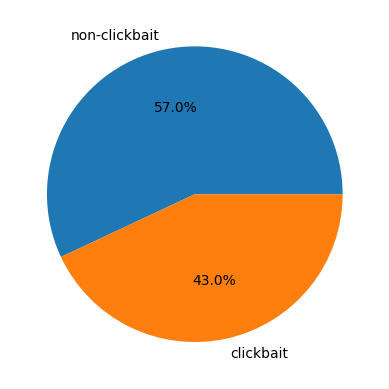

In [ ]:
plt.pie(df['label'].value_counts(), labels=df['label'].unique().tolist(), autopct='%1.1f%%')
plt.show()

<Axes: >

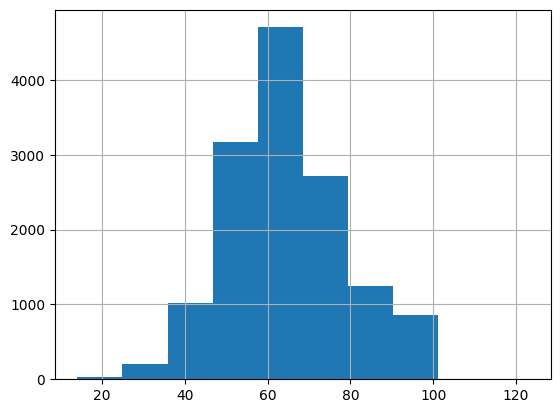

In [ ]:
df['title'].str.len().hist()

<Axes: >

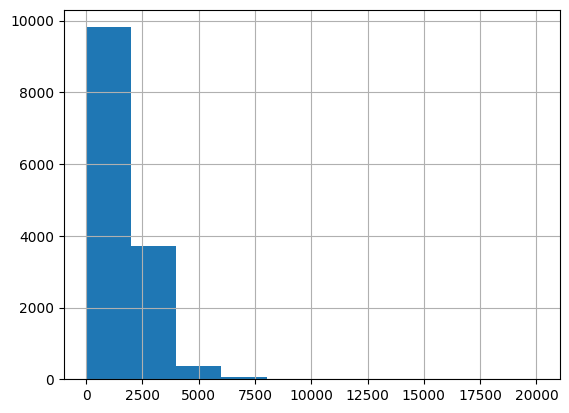

In [ ]:
df['content'].str.len().hist()

### Panjang(kata)

<Axes: >

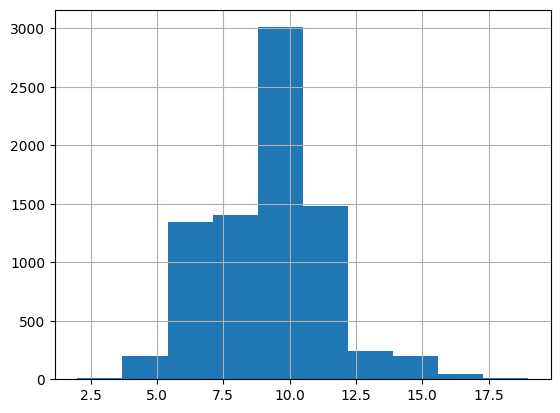

In [38]:
df.where(df['label_score']==0).dropna()['title'].str.split().map(lambda x: len(x)).hist()

<Axes: >

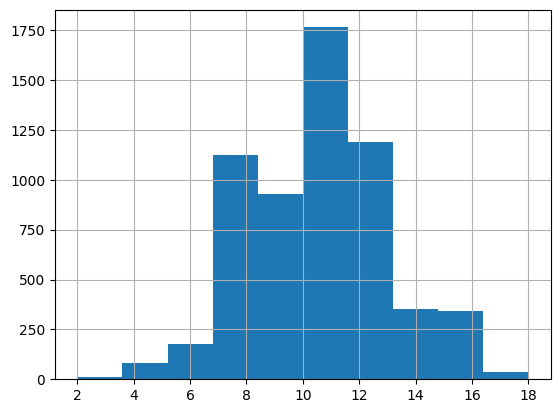

In [39]:
df.where(df['label_score']==1).dropna()['title'].str.split().map(lambda x: len(x)).hist()

<Axes: >

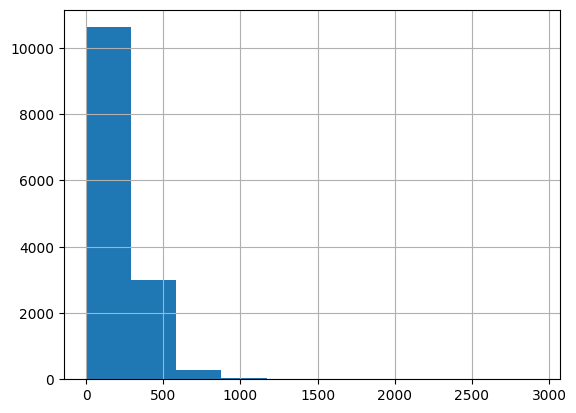

In [ ]:
df['content'].str.split().map(lambda x: len(x)).hist()

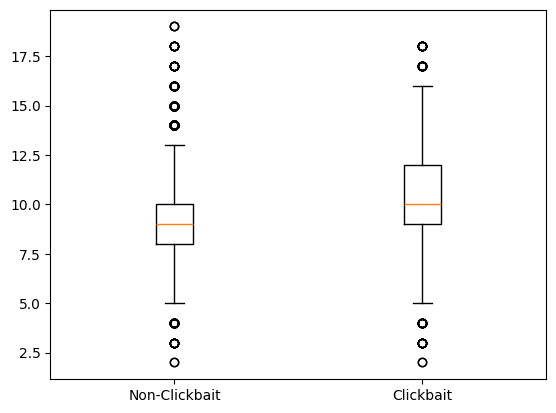

In [ ]:
df['title_word_count'] = df['title'].str.split().apply(len)
df_1 = df.where(df['label_score']==0).dropna()['title_word_count']
df_2 = df.where(df['label_score']==1).dropna()['title_word_count']

ax = plt.boxplot([df_1, df_2], tick_labels=['Non-Clickbait', 'Clickbait'])


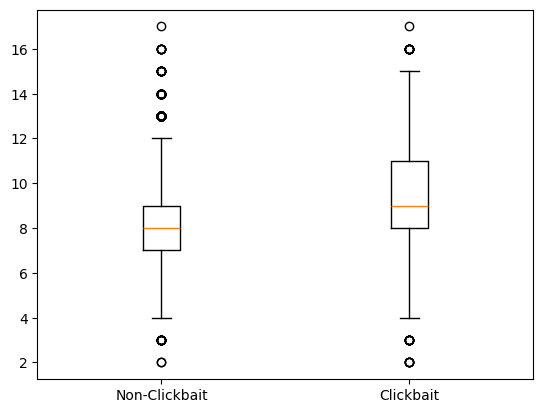

In [ ]:
df['normalized_title_word_count'] = df['normalized_title'].str.split().apply(len)
df_1 = df.where(df['label_score']==0).dropna()['normalized_title_word_count']
df_2 = df.where(df['label_score']==1).dropna()['normalized_title_word_count']

ax = plt.boxplot([df_1, df_2], tick_labels=['Non-Clickbait', 'Clickbait'])


### Wordcloud

In [ ]:
print(df.where(df['label_score']==0).dropna()['title'].count())
print(df.where(df['label_score']==1).dropna()['title'].count())

7944
6005


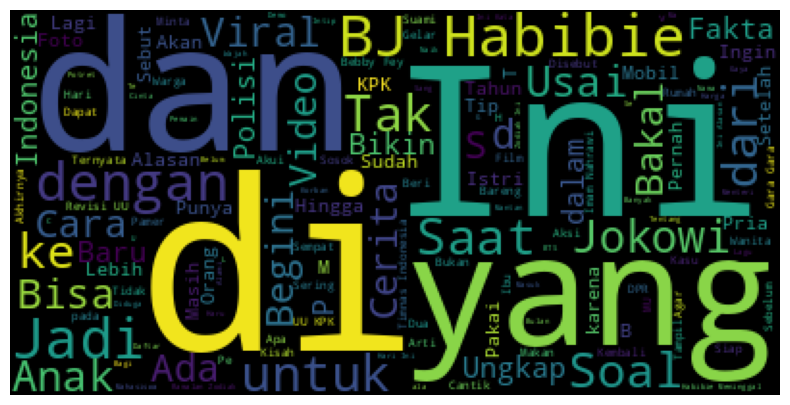

In [15]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
# cloud0 = WordCloud()
# cloud1 = WordCloud()
cloud2 = WordCloud()
# cloud0 = cloud0.generate(df['title'].to_string())
# cloud1 = cloud1.generate(df.where(df['label_score']==0).dropna()['title'].to_string())
cloud2 = cloud2.generate(df.where(df['label_score']==1).dropna()['title'].to_string())

# f, axarr = plt.subplots(3,1)
# f.set_size_inches(8, 12)
# axarr[0].imshow(cloud0)
# axarr[1].imshow(cloud1)
# axarr[2].imshow(cloud2)
plt.figure(figsize=(10, 5))
plt.imshow(cloud2)
plt.axis('off')  
plt.show()

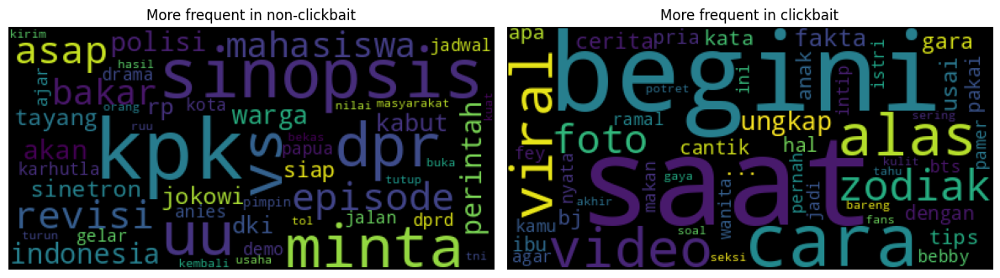

In [36]:
# perbedaan frekuensi kata
from collections import Counter
words1 = ''.join(df.where(df['label_score']==0).dropna()['normalized_title'].to_string())
words2 = ''.join(df.where(df['label_score']==1).dropna()['normalized_title'].to_string())

# print(words1[:40])

freq1 = Counter(words1.split())
freq2 = Counter(words2.split())

# print(freq1)

all_words = set(freq1.keys()) | set(freq2.keys())
total1, total2 = sum(freq1.values()), sum(freq2.values())

diff = {word: freq1.get(word, 0)/total1 - freq2.get(word, 0)/total2 
        for word in all_words}

pos_words = {w: d for w, d in diff.items() if d > 0}
neg_words = {w: -d for w, d in diff.items() if d < 0}

pos_words = dict(sorted(pos_words.items(), key=lambda x: x[1], reverse=True)[:50])
neg_words = dict(sorted(neg_words.items(), key=lambda x: x[1], reverse=True)[:50])

# Generate word clouds
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

if pos_words:
    wc1 = WordCloud().generate_from_frequencies(pos_words)
    ax1.imshow(wc1)
    ax1.set_title('More frequent in non-clickbait')

if neg_words:
    wc2 = WordCloud().generate_from_frequencies(neg_words)
    ax2.imshow(wc2)
    ax2.set_title('More frequent in clickbait')

ax1.axis('off')
ax2.axis('off')
plt.tight_layout()
plt.show()

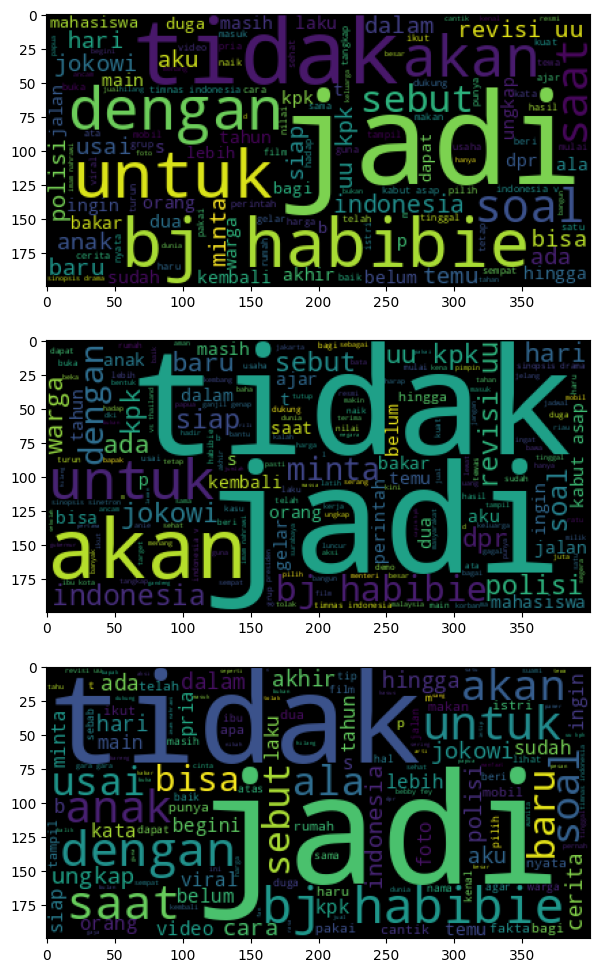

In [ ]:
cloud0 = cloud0.generate(df['normalized_title'].to_string())
cloud1 = cloud1.generate(df.where(df['label_score']==0).dropna()['normalized_title'].to_string())
cloud2 = cloud2.generate(df.where(df['label_score']==1).dropna()['normalized_title'].to_string())

f, axarr = plt.subplots(3,1)
f.set_size_inches(8, 12)
axarr[0].imshow(cloud0)
axarr[1].imshow(cloud1)
axarr[2].imshow(cloud2)
plt.show()

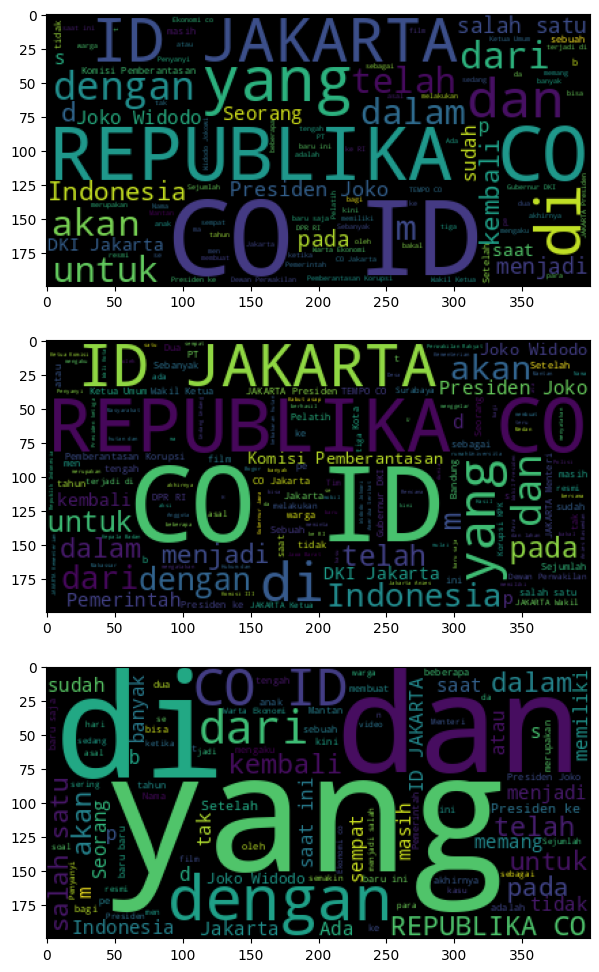

In [ ]:
cloud0 = WordCloud()
cloud1 = WordCloud()
cloud2 = WordCloud()
cloud0 = cloud0.generate(df['content'].to_string())
cloud1 = cloud1.generate(df.where(df['label_score']==0).dropna()['content'].to_string())
cloud2 = cloud2.generate(df.where(df['label_score']==1).dropna()['content'].to_string())

f, axarr = plt.subplots(3,1)
f.set_size_inches(8, 12)
axarr[0].imshow(cloud0)
axarr[1].imshow(cloud1)
axarr[2].imshow(cloud2)
plt.show()

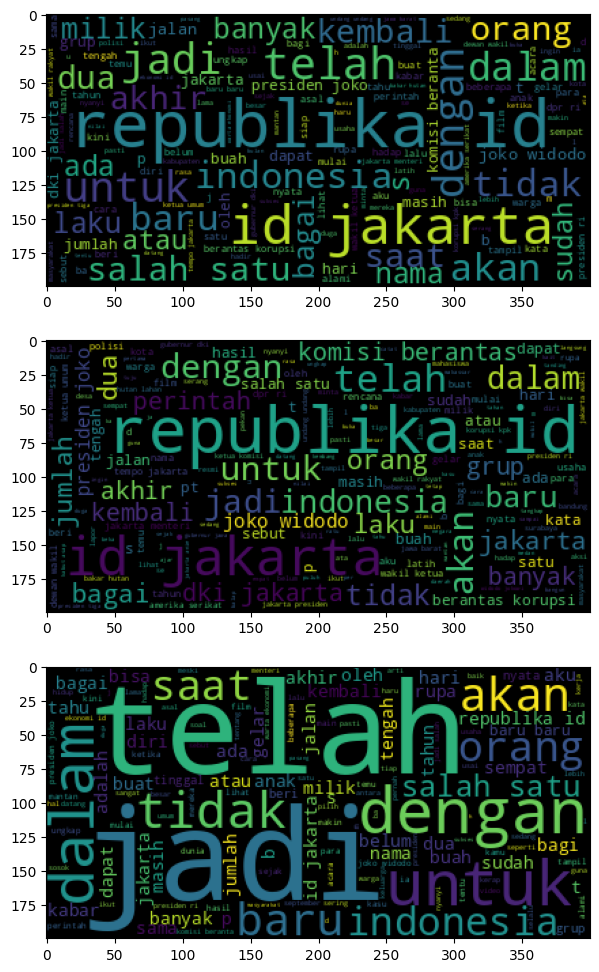

In [ ]:
cloud0 = cloud0.generate(df['normalized_content'].to_string())
cloud1 = cloud1.generate(df.where(df['label_score']==0).dropna()['normalized_content'].to_string())
cloud2 = cloud2.generate(df.where(df['label_score']==1).dropna()['normalized_content'].to_string())

f, axarr = plt.subplots(3,1)
f.set_size_inches(8, 12)
axarr[0].imshow(cloud0)
axarr[1].imshow(cloud1)
axarr[2].imshow(cloud2)
plt.show()

# Machine

In [1]:
# !pip install tensorflow
# !pip install tf-keras
# !pip install -q pydot

In [1]:
import os
import re
import json
import string
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import clone_model
from tensorflow.keras.applications import EfficientNetV2B0
from sklearn.metrics import accuracy_score, classification_report
from transformers import AutoModel, TFAutoModel, AutoTokenizer, BertTokenizer
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split

2025-09-27 23:01:08.252566: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Data loading

In [2]:
df = pd.read_csv('click-id/dataset_with_image/combined_final_final.csv')

### Tokenizer and Model

In [3]:
tokenizer = BertTokenizer.from_pretrained("indobenchmark/indobert-base-p1")

In [4]:
df_train, df_val = train_test_split(df[['title','content','image_path_processed','label_score']],test_size = 0.2 ,random_state = 93)
df_train.shape , df_val.shape

((11174, 4), (2794, 4))

In [5]:
tokens_train = {
   'title':tokenizer.batch_encode_plus(
    df_train['title'].tolist(),
    max_length = 32,
    padding = 'max_length',
    truncation = True
   ),
    'content':tokenizer.batch_encode_plus(
    df_train['content'].tolist(),
    max_length = 128,
    padding = 'max_length',
    truncation = True
   )
}

tokens_val = {
  'title' : tokenizer.batch_encode_plus(
    df_val['title'].tolist(),
    max_length = 32,
    padding = 'max_length',
    truncation=True
  ),
  'content' : tokenizer.batch_encode_plus(
    df_val['content'].tolist(),
    max_length = 128,
    padding = 'max_length',
    truncation=True
  )
}

In [9]:
## checking non jpeg files

# from pathlib import Path
# import imghdr

# data_dir = "/content/drive/MyDrive/click-id/images"
# image_extensions = [".png", ".jpg"]  # add there all your images file extensions

# img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]
# for filepath in Path(data_dir).rglob("*"):
#     if filepath.suffix.lower() in image_extensions:
#         img_type = imghdr.what(filepath)
#         if img_type is None:
#             print(f"{filepath} is not an image")
#         elif img_type not in img_type_accepted_by_tf:
#             print(f"{filepath} is a {img_type}, not accepted by TensorFlow")

In [10]:
IMG_HEIGHT = 224
IMG_WIDTH = 224

def load_and_preprocess_images(image_paths):
    images = []
    n = 0
    for path in image_paths:
        n = n+1
        newpath = "/".join(i for i in path.split("/")[-4:])
        # print(newpath)
        img = tf.io.read_file(newpath)
        img = tf.image.decode_image(img, channels=3)
        # img = tf.cast(img, tf.float32)
        # img = img/255.0

        images.append(img)
        if n%100 == 0:
          print(n,'images processed')
    return tf.stack(images)

with tf.device("/cpu:0"):
    train_images = load_and_preprocess_images(df_train['image_path_processed'].tolist())
    val_images = load_and_preprocess_images(df_val['image_path_processed'].tolist())

2025-08-15 13:11:24.785341: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-15 13:11:24.793735: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-15 13:11:24.793781: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-15 13:11:24.795803: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-15 13:11:24.795846: I external/local_xla/xla/stream_executor

100 images processed
200 images processed
300 images processed
400 images processed
500 images processed
600 images processed
700 images processed
800 images processed
900 images processed
1000 images processed
1100 images processed
1200 images processed
1300 images processed
1400 images processed
1500 images processed
1600 images processed
1700 images processed
1800 images processed
1900 images processed
2000 images processed
2100 images processed
2200 images processed
2300 images processed
2400 images processed
2500 images processed
2600 images processed
2700 images processed
2800 images processed
2900 images processed
3000 images processed
3100 images processed
3200 images processed
3300 images processed
3400 images processed
3500 images processed
3600 images processed
3700 images processed
3800 images processed
3900 images processed
4000 images processed
4100 images processed
4200 images processed
4300 images processed
4400 images processed
4500 images processed
4600 images process

2025-08-15 13:11:34.321205: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1681999872 exceeds 10% of free system memory.


100 images processed
200 images processed
300 images processed
400 images processed
500 images processed
600 images processed
700 images processed
800 images processed
900 images processed
1000 images processed
1100 images processed
1200 images processed
1300 images processed
1400 images processed
1500 images processed
1600 images processed
1700 images processed
1800 images processed
1900 images processed
2000 images processed
2100 images processed
2200 images processed
2300 images processed
2400 images processed
2500 images processed
2600 images processed
2700 images processed
100 images processed
200 images processed
300 images processed
400 images processed
500 images processed
600 images processed
700 images processed
800 images processed
900 images processed
1000 images processed
1100 images processed
100 images processed
200 images processed
300 images processed
400 images processed
500 images processed
600 images processed
700 images processed
800 images processed
900 images pro

In [11]:
with tf.device("/cpu:0"):
    def save_tf_dataset(images, filename):
        dataset = tf.data.Dataset.from_tensor_slices(images)
        
        tf.data.Dataset.save(dataset, filename)
        print(f"Dataset saved to {filename}")
    
    # Save the datasets
    save_tf_dataset(train_images, "./train_images_dataset")
    save_tf_dataset(val_images, "./val_images_dataset")

2025-08-15 13:11:38.097966: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1681999872 exceeds 10% of free system memory.


Dataset saved to ./train_images_dataset
Dataset saved to ./val_images_dataset
Dataset saved to ./val_c_images_dataset
Dataset saved to ./val_non_c_images_dataset


In [12]:
train_images = tf.data.Dataset.load("train_images_dataset")
val_images = tf.data.Dataset.load("val_images_dataset")

In [13]:
train_data = {
    'title':tf.squeeze(tf.convert_to_tensor(tokens_train['title']['input_ids'])),
    'content':tf.squeeze(tf.convert_to_tensor(tokens_train['content']['input_ids'])),
    'titlemask':tf.squeeze(tf.convert_to_tensor(tokens_train['title']['attention_mask'])),
    'contentmask':tf.squeeze(tf.convert_to_tensor(tokens_train['content']['attention_mask'])),
}

validation_data = {
    'title':tf.convert_to_tensor(tokens_val['title']['input_ids']),
    'content':tf.convert_to_tensor(tokens_val['content']['input_ids']),
    'titlemask':tf.convert_to_tensor(tokens_val['title']['attention_mask']),
    'contentmask':tf.convert_to_tensor(tokens_val['content']['attention_mask']),
}


label_train = tf.convert_to_tensor(df_train['label_score'].tolist())
label_val = tf.convert_to_tensor(df_val['label_score'].tolist())

In [15]:
dataset = (tf.data.Dataset.from_tensor_slices((dict(train_data),label_train))
    .prefetch(tf.data.AUTOTUNE)
    .cache()
    )
dataVal = (tf.data.Dataset.from_tensor_slices((dict(validation_data),label_val))
    .prefetch(tf.data.AUTOTUNE)
    .cache()
    )

dataset = tf.data.Dataset.zip((dataset, train_images))
dataVal = tf.data.Dataset.zip((dataVal, val_images))

def add_image_and_fix_shapes(text_data_label, image):
    text_data, label = text_data_label
    new_data = {
        'title': tf.ensure_shape(text_data['title'], [None, 32]),
        'content': tf.ensure_shape(text_data['content'], [None, 128]),
        'titlemask': tf.ensure_shape(text_data['titlemask'], [None, 32]),
        'contentmask': tf.ensure_shape(text_data['contentmask'], [None, 128]),
        'image': image
    }
    
    return new_data, label

dataset = (dataset
    .batch(32)
    .map(add_image_and_fix_shapes)
    .prefetch(tf.data.AUTOTUNE)
    .cache()
)

dataVal = (dataVal
    .batch(32)
    .map(add_image_and_fix_shapes)
    .prefetch(tf.data.AUTOTUNE)
    .cache()
)


In [16]:
tf.data.Dataset.save(dataset, "./dataset")
tf.data.Dataset.save(dataVal, "./dataVal")

In [2]:
dataset = tf.data.Dataset.load(
    "dataset",
    element_spec=({
        'title': tf.TensorSpec(shape=(None, 32), dtype=tf.int32),
        'content': tf.TensorSpec(shape=(None, 128), dtype=tf.int32),
        'titlemask': tf.TensorSpec(shape=(None, 32), dtype=tf.int32),
        'contentmask': tf.TensorSpec(shape=(None, 128), dtype=tf.int32),
        'image': tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.uint8)
    }, tf.TensorSpec(shape=(None,), dtype=tf.int32))
)

dataVal = tf.data.Dataset.load(
    "dataVal",
    element_spec=({
        'title': tf.TensorSpec(shape=(None, 32), dtype=tf.int32),
        'content': tf.TensorSpec(shape=(None, 128), dtype=tf.int32),
        'titlemask': tf.TensorSpec(shape=(None, 32), dtype=tf.int32),
        'contentmask': tf.TensorSpec(shape=(None, 128), dtype=tf.int32),
        'image': tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.uint8)
    }, tf.TensorSpec(shape=(None,), dtype=tf.int32))
)

2025-09-26 17:40:53.960751: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-09-26 17:40:53.979214: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-09-26 17:40:53.979267: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-09-26 17:40:53.981656: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-09-26 17:40:53.981701: I external/local_xla/xla/stream_executor

[CLS] peringatkan farhat abbas, hotman paris : jaga kesehatan dan minum vitamin [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]


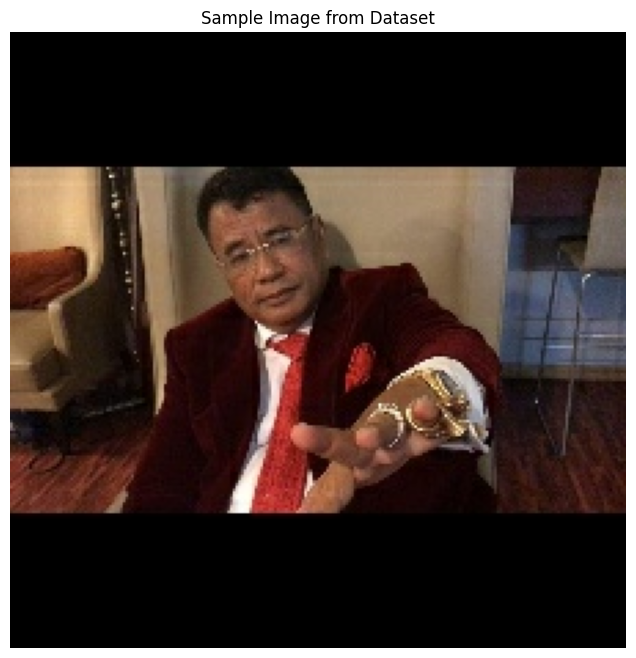

2025-06-03 17:08:23.748033: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [59]:
import matplotlib.pyplot as plt

# Take one batch and show the first image
for batch in dataset.take(1):
    features, _ = batch
    title_text = tokenizer.decode(features['title'][0].numpy())
    content_text = tokenizer.decode(features['content'][0].numpy())
    print(title_text)
    image = features['image'][0].numpy()  # Get first image
    
    # Ensure image is in displayable range [0, 1]
    if image.max() > 1.0:
        image = image / 255.0
    
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title('Sample Image from Dataset')
    plt.show()

In [3]:
class BertEmbeddingLayer(tf.keras.layers.Layer):
    def __init__(self, model_name, **kwargs):
        super(BertEmbeddingLayer, self).__init__(**kwargs)
        self.model_name = model_name
        self.embedding_size = None
        self.bert = None

    def build(self, input_shape):
        self.bert = TFAutoModel.from_pretrained(self.model_name)
        self.bert.trainable = True
        self.embedding_size = self.bert.config.hidden_size
        super(BertEmbeddingLayer, self).build(input_shape)

    def call(self, inputs):
        ids, att = inputs
        outputs = self.bert(input_ids=ids, attention_mask=att)
        return outputs.pooler_output

    def get_config(self):
        config = super(BertEmbeddingLayer, self).get_config()
        config.update({
            "model_name": self.model_name
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        clean_config = {k: v for k, v in config.items() 
                      if k in ['model_name', 'name', 'trainable', 'dtype']}
        return cls(**clean_config)

In [4]:
def makemodel(output_bias=None):
    # Text using IndoBertp1
    ids1 = tf.keras.layers.Input(shape=(32,), dtype=tf.int32, name="title")
    att1 = tf.keras.layers.Input(shape=(32,), dtype=tf.int32, name="titlemask")
    ids2 = tf.keras.layers.Input(shape=(128,), dtype=tf.int32, name="content")
    att2 = tf.keras.layers.Input(shape=(128,), dtype=tf.int32, name="contentmask")

    indobert1 = BertEmbeddingLayer(model_name="indobenchmark/indobert-base-p1", name="indobert1")
    indobert2 = BertEmbeddingLayer(model_name="indobenchmark/indobert-base-p1", name="indobert2")

    title = indobert1([ids1, att1])
    content = indobert2([ids2, att2])

    # Image using EfficientNetV2s
    img1 = tf.keras.layers.Input(shape=(224,224,3), dtype=tf.uint8, name="image")

    effi = EfficientNetV2B0(
        include_top = False,
        weights = 'imagenet',
        input_shape = (224,224,3),
        pooling = 'max'
    )
    image = effi(img1)

    fin = tf.keras.layers.concatenate([title, content, image])
    fin = tf.keras.layers.BatchNormalization()(fin)
        
    fin = tf.keras.layers.Dense(512, activation=None)(fin)
    fin = tf.keras.layers.BatchNormalization()(fin)
    fin = tf.keras.layers.Activation('relu')(fin)
    fin = tf.keras.layers.Dropout(0.4)(fin) 

    fin = tf.keras.layers.Dense(256, activation=None)(fin)
    fin = tf.keras.layers.BatchNormalization()(fin)
    fin = tf.keras.layers.Activation('relu')(fin)
    fin = tf.keras.layers.Dropout(0.4)(fin) 
    
    fin = tf.keras.layers.Dense(128, activation=None)(fin)
    fin = tf.keras.layers.BatchNormalization()(fin)
    fin = tf.keras.layers.Activation('relu')(fin)
    fin = tf.keras.layers.Dropout(0.4)(fin) 
    
    fin = tf.keras.layers.Dense(64)(fin)
    fin = tf.keras.layers.BatchNormalization()(fin)
    fin = tf.keras.layers.Activation('relu')(fin)
    fin = tf.keras.layers.Dropout(0.2)(fin)
    fin = tf.keras.layers.Dense(1)(fin)
    fin = tf.keras.layers.Activation('sigmoid')(fin)

    final = tf.keras.Model(inputs=[ids1, att1, ids2, att2, img1], outputs=fin)

    for layer in final.layers:
      layer.trainable = True
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00005)
    final.compile(
        loss = tf.keras.losses.BinaryCrossentropy(),
        optimizer=optimizer,
        metrics=[tf.keras.metrics.BinaryAccuracy(),tf.keras.metrics.Precision(),tf.keras.metrics.Recall()]
    )

    return final

final = makemodel()
final.summary()

Some layers from the model checkpoint at indobenchmark/indobert-base-p1 were not used when initializing TFBertModel: ['mlm___cls', 'nsp___cls', 'bert/encoder/layer_._8/attention/output/LayerNorm/beta:0', 'bert/encoder/layer_._9/attention/output/dense/bias:0', 'bert/encoder/layer_._11/output/LayerNorm/beta:0', 'bert/encoder/layer_._8/attention/self/value/bias:0', 'bert/encoder/layer_._4/attention/self/query/kernel:0', 'bert/encoder/layer_._10/attention/output/dense/kernel:0', 'bert/encoder/layer_._0/output/LayerNorm/beta:0', 'bert/encoder/layer_._10/output/dense/bias:0', 'bert/encoder/layer_._7/attention/output/dense/bias:0', 'bert/encoder/layer_._5/output/dense/kernel:0', 'bert/encoder/layer_._5/attention/self/query/kernel:0', 'bert/encoder/layer_._3/attention/output/dense/bias:0', 'bert/encoder/layer_._1/output/LayerNorm/gamma:0', 'bert/embeddings/token_type_embeddings/embeddings:0', 'bert/encoder/layer_._3/attention/self/key/kernel:0', 'bert/encoder/layer_._0/attention/output/dense/k

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ title (InputLayer)  │ (None, 32)        │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ titlemask           │ (None, 32)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ content             │ (None, 128)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ contentmask         │ (None, 128)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image (InputLayer)  │ (None, 224, 224,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ indobert1           │ (None, 768)       │          0 │ title[0][0],      │
│ (BertEmbeddingLaye… │                   │            │ titlemask[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ indobert2           │ (None, 768)       │          0 │ content[0][0],    │
│ (BertEmbeddingLaye… │                   │            │ contentmask[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetv2-b0   │ (None, 1280)      │  5,919,312 │ image[0][0]       │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2816)      │          0 │ indobert1[0][0],  │
│ (Concatenate)       │                   │            │ indobert2[0][0],  │
│                     │                   │            │ efficientnetv2-b… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 2816)      │     11,264 │ concatenate[0][0] │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 512)       │  1,442,304 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512)       │      2,048 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 512)       │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512)       │          0 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │    131,328 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_1[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256)       │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256)       │          0 │ activation_1[0][

 Total params: 7,549,265 (28.80 MB)

 Trainable params: 7,481,105 (28.54 MB)

 Non-trainable params: 68,160 (266.25 KB)

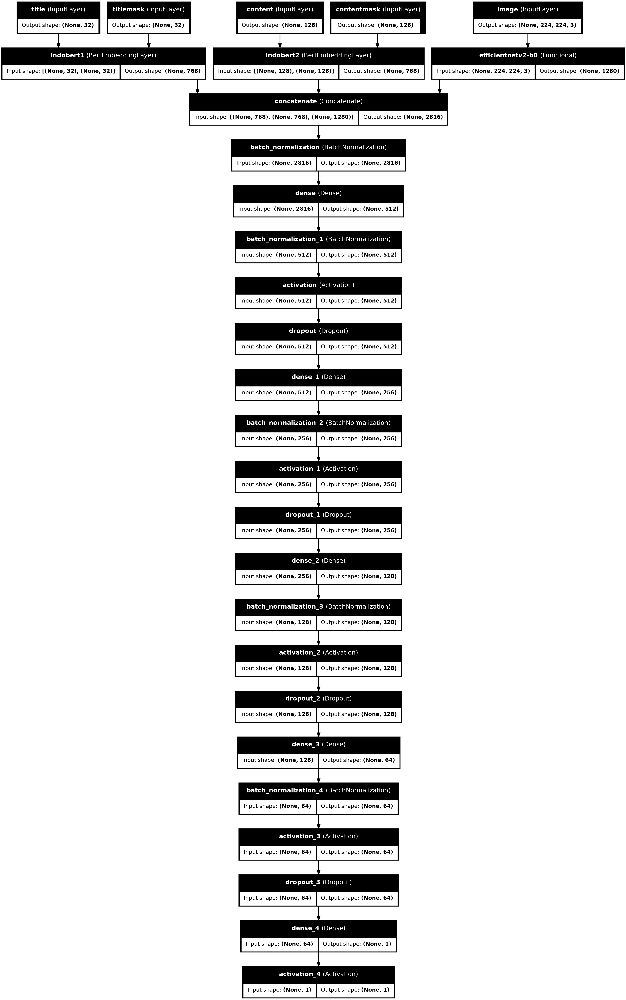

In [5]:
from tensorflow.keras.utils import plot_model
plot_model(
    final,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    expand_nested=False
    )

In [6]:
tf.keras.mixed_precision.set_global_policy('mixed_float16')

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
    )

# model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
#     filepath='./models/best_model_val_loss_{val_loss:.4f}.weights.h5',
#     monitor='val_loss',
#     save_best_only=True,
#     save_weights_only=True
# )

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=1,
    min_lr=1e-8
)

history=final.fit(x = dataset,
                  epochs = 50,
                  callbacks=[early_stopping, 
                             # model_checkpoint, 
                             reduce_lr],
                  validation_data=dataVal
                  )

Epoch 1/50


I0000 00:00:1758883337.824786   54668 service.cc:145] XLA service 0x7665a0015270 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758883337.824832   54668 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3070, Compute Capability 8.6
2025-09-26 17:42:19.491918: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
W0000 00:00:1758883340.513505   54668 assert_op.cc:38] Ignoring Assert operator functional_1/indobert1_1/tf_bert_model/bert/embeddings/assert_less/Assert/Assert
W0000 00:00:1758883340.639639   54668 assert_op.cc:38] Ignoring Assert operator functional_1/indobert2_1/tf_bert_model_1/bert/embeddings/assert_less/Assert/Assert
2025-09-26 17:42:26.270269: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
I0000 00:00:1758883364.131732   54882 asm_compiler.cc:369] ptxas warning :

349/350 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - binary_accuracy: 0.5275 - loss: 0.7775 - precision: 0.4632 - recall: 0.5635

W0000 00:00:1758883452.319281   54663 assert_op.cc:38] Ignoring Assert operator functional_1/indobert1_1/tf_bert_model/bert/embeddings/assert_less/Assert/Assert
W0000 00:00:1758883452.324960   54663 assert_op.cc:38] Ignoring Assert operator functional_1/indobert2_1/tf_bert_model_1/bert/embeddings/assert_less/Assert/Assert
I0000 00:00:1758883471.845800   54977 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_7', 12 bytes spill stores, 12 bytes spill loads

I0000 00:00:1758883472.042265   54976 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_7', 20 bytes spill stores, 20 bytes spill loads

I0000 00:00:1758883472.157959   54974 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_7', 96 bytes spill stores, 96 bytes spill loads

I0000 00:00:1758883472.251003   54970 asm_compiler.cc:369] ptxas warning : Registers are spilled to loc

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - binary_accuracy: 0.5276 - loss: 0.7774 - precision: 0.4633 - recall: 0.5635

W0000 00:00:1758883514.620024   54669 assert_op.cc:38] Ignoring Assert operator functional_1/indobert1_1/tf_bert_model/bert/embeddings/assert_less/Assert/Assert
W0000 00:00:1758883514.724395   54669 assert_op.cc:38] Ignoring Assert operator functional_1/indobert2_1/tf_bert_model_1/bert/embeddings/assert_less/Assert/Assert
I0000 00:00:1758883517.306792   55190 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_13850', 8 bytes spill stores, 8 bytes spill loads

W0000 00:00:1758883529.075254   54668 assert_op.cc:38] Ignoring Assert operator functional_1/indobert1_1/tf_bert_model/bert/embeddings/assert_less/Assert/Assert
W0000 00:00:1758883529.081370   54668 assert_op.cc:38] Ignoring Assert operator functional_1/indobert2_1/tf_bert_model_1/bert/embeddings/assert_less/Assert/Assert
I0000 00:00:1758883530.949622   55278 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_26', 20 bytes spi

350/350 ━━━━━━━━━━━━━━━━━━━━ 246s 384ms/step - binary_accuracy: 0.5276 - loss: 0.7773 - precision: 0.4633 - recall: 0.5635 - val_binary_accuracy: 0.6475 - val_loss: 0.6383 - val_precision: 0.6256 - val_recall: 0.4272 - learning_rate: 5.0000e-05
Epoch 2/50
350/350 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - binary_accuracy: 0.6180 - loss: 0.6876 - precision: 0.5572 - recall: 0.5772 - val_binary_accuracy: 0.6969 - val_loss: 0.5904 - val_precision: 0.6908 - val_recall: 0.5206 - learning_rate: 5.0000e-05
Epoch 3/50
350/350 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - binary_accuracy: 0.6425 - loss: 0.6517 - precision: 0.5939 - recall: 0.5568 - val_binary_accuracy: 0.7069 - val_loss: 0.5711 - val_precision: 0.7042 - val_recall: 0.5366 - learning_rate: 5.0000e-05
Epoch 4/50
350/350 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - binary_accuracy: 0.6707 - loss: 0.6117 - precision: 0.6329 - recall: 0.5721 - val_binary_accuracy: 0.7180 - val_loss: 0.5573 - val_precision: 0.7215 - val_recall: 0.5492 - learning_rate: 5

In [10]:
y_pred = final.predict(dataVal)
y_pred_binary = (y_pred > 0.5).astype(int)
from sklearn.metrics import classification_report
y_val = np.concatenate([y for _, y in dataVal.as_numpy_iterator()])
print(classification_report(y_val, y_pred_binary, 
                           target_names=['Class_0', 'Class_1'],
                           digits = 4))

              precision    recall  f1-score   support

     Class_0     0.7615    0.8037    0.7821      1605
     Class_1     0.7136    0.6602    0.6859      1189

    accuracy                         0.7427      2794
   macro avg     0.7376    0.7320    0.7340      2794
weighted avg     0.7411    0.7427    0.7411      2794



2025-08-16 10:06:50.184879: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


dict_keys(['binary_accuracy', 'loss', 'precision', 'recall', 'val_binary_accuracy', 'val_loss', 'val_precision', 'val_recall', 'learning_rate'])
Final training loss: 0.39723140001296997


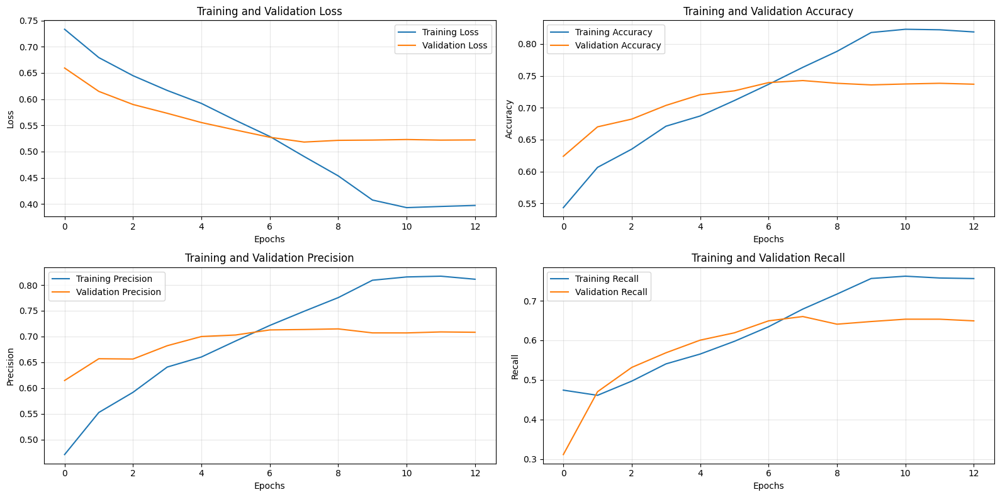


FINAL METRICS SUMMARY
Loss           : Train = 0.3972, Val = 0.5222
Binary_accuracy: Train = 0.8190, Val = 0.7369
Precision      : Train = 0.8113, Val = 0.7083
Recall         : Train = 0.7562, Val = 0.6493


In [9]:
print(history.history.keys())
final_loss = history.history['loss'][-1]
print(f"Final training loss: {final_loss}")

import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
plt.subplot(2, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True, alpha=0.3)

if 'binary_accuracy' in history.history:
    plt.subplot(2, 2, 2)
    plt.plot(history.history['binary_accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_binary_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)

if 'precision' in history.history:
    plt.subplot(2, 2, 3)
    plt.plot(history.history['precision'], label='Training Precision')
    plt.plot(history.history['val_precision'], label='Validation Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.title('Training and Validation Precision')
    plt.legend()
    plt.grid(True, alpha=0.3)

if 'recall' in history.history:
    plt.subplot(2, 2, 4)
    plt.plot(history.history['recall'], label='Training Recall')
    plt.plot(history.history['val_recall'], label='Validation Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.title('Training and Validation Recall')
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n" + "="*50)
print("FINAL METRICS SUMMARY")
print("="*50)

metrics_to_show = ['loss', 'binary_accuracy', 'precision', 'recall']
for metric in metrics_to_show:
    if metric in history.history:
        train_val = history.history[metric][-1]
        val_key = f'val_{metric}'
        val_val = history.history[val_key][-1] if val_key in history.history else None
        
        print(f"{metric.capitalize():15}: Train = {train_val:.4f}", end="")
        if val_val is not None:
            print(f", Val = {val_val:.4f}")
        else:
            print()